In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import f1_score, confusion_matrix, classification_report
from sklearn.model_selection import learning_curve
import torch

# Analyse exploratoire des données tabulaires

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/train.csv')

In [ ]:
df.head()

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,...,4.0,2.0,4.0,55.0,NaN,NaN,NaN,Fall,3.0,2.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,...,0.0,0.0,0.0,0.0,Fall,46.0,64.0,Summer,0.0,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,...,2.0,1.0,1.0,28.0,Fall,38.0,54.0,Summer,2.0,0.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,...,3.0,4.0,1.0,44.0,Summer,31.0,45.0,Winter,0.0,1.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.describe()

,Basic_Demos-Age,Basic_Demos-Sex,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,Physical-Systolic_BP,...,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-computerinternet_hoursday,sii
count,3960.000000,3960.000000,2421.000000,3022.000000,3027.000000,3076.000000,898.000000,2954.000000,2967.000000,2954.000000,...,2728.000000,2725.000000,2728.000000,2730.000000,2733.000000,2736.000000,2609.000000,2606.000000,3301.000000,2736.000000
mean,10.433586,0.372727,65.454771,19.331929,55.946713,89.038615,27.278508,69.648951,81.597236,116.983074,...,1.452346,1.627890,1.613636,1.158974,0.943652,27.896199,41.088923,57.763622,1.060588,0.580409
std,3.574648,0.483591,22.341862,5.113934,7.473764,44.569040,5.567287,13.611226,13.665196,17.061225,...,1.495600,1.445622,1.529178,1.343661,1.185460,20.338853,10.427433,13.196091,1.094875,0.771122
min,5.000000,0.000000,25.000000,0.000000,33.000000,0.000000,18.000000,0.000000,27.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,38.000000,0.000000,0.000000
25%,8.000000,0.000000,59.000000,15.869350,50.000000,57.200000,23.000000,61.000000,72.000000,107.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,33.000000,47.000000,0.000000,0.000000
50%,10.000000,0.000000,65.000000,17.937682,55.000000,77.000000,26.000000,68.000000,81.000000,114.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,26.000000,39.000000,55.000000,1.000000,0.000000
75%,13.000000,1.000000,75.000000,21.571244,62.000000,113.800000,30.000000,76.000000,90.500000,125.000000,...,2.000000,3.000000,2.000000,2.000000,1.000000,41.000000,46.000000,64.000000,2.000000,1.000000
max,22.000000,1.000000,999.000000,59.132048,78.500000,315.000000,50.000000,179.000000,138.000000,203.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,93.000000,96.000000,100.000000,3.000000,3.000000


In [ ]:
df.shape

(3960, 82)

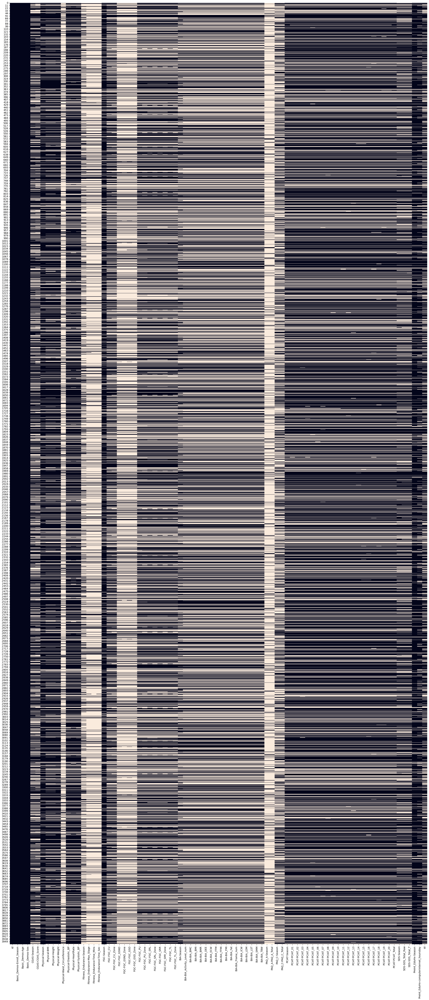

In [ ]:
plt.figure(figsize=(30, 68))
sns.heatmap(df.isna(), cbar=False)
plt.show()

In [ ]:
pd.set_option('display.max_rows', None)
def pourcentage_valeurs_manquantes(df_f):
    return (df_f.isnull().sum() / len(df)) * 100

pourcentage_valeurs_manquantes(df)

,0
id,0.000000
Basic_Demos-Enroll_Season,0.000000
Basic_Demos-Age,0.000000
Basic_Demos-Sex,0.000000
CGAS-Season,35.479798
CGAS-CGAS_Score,38.863636
Physical-Season,16.414141
Physical-BMI,23.686869
Physical-Height,23.560606
Physical-Weight,22.323232


Les données démographiques sont complètes (0% de valeurs manquantes), garantissant une bonne segmentation. En revanche, de nombreuses variables cliniques et questionnaires (notamment PAQ_A, PAQ_C, Fitness_Endurance, certaines mesures FGC et BIA) présentent des taux élevés de valeurs manquantes (jusqu’à 88% pour certaines). la cible sii contient 30.9% de valeurs manquantes. Ces disparités indiquent la nécessité d’analyser les patterns d’absence et de définir des stratégies adaptées , (imputation et/ou exclusion) pour assurer la robustesse des analyses ultérieures.

In [ ]:
df = df.drop(columns=['id'], errors='ignore')

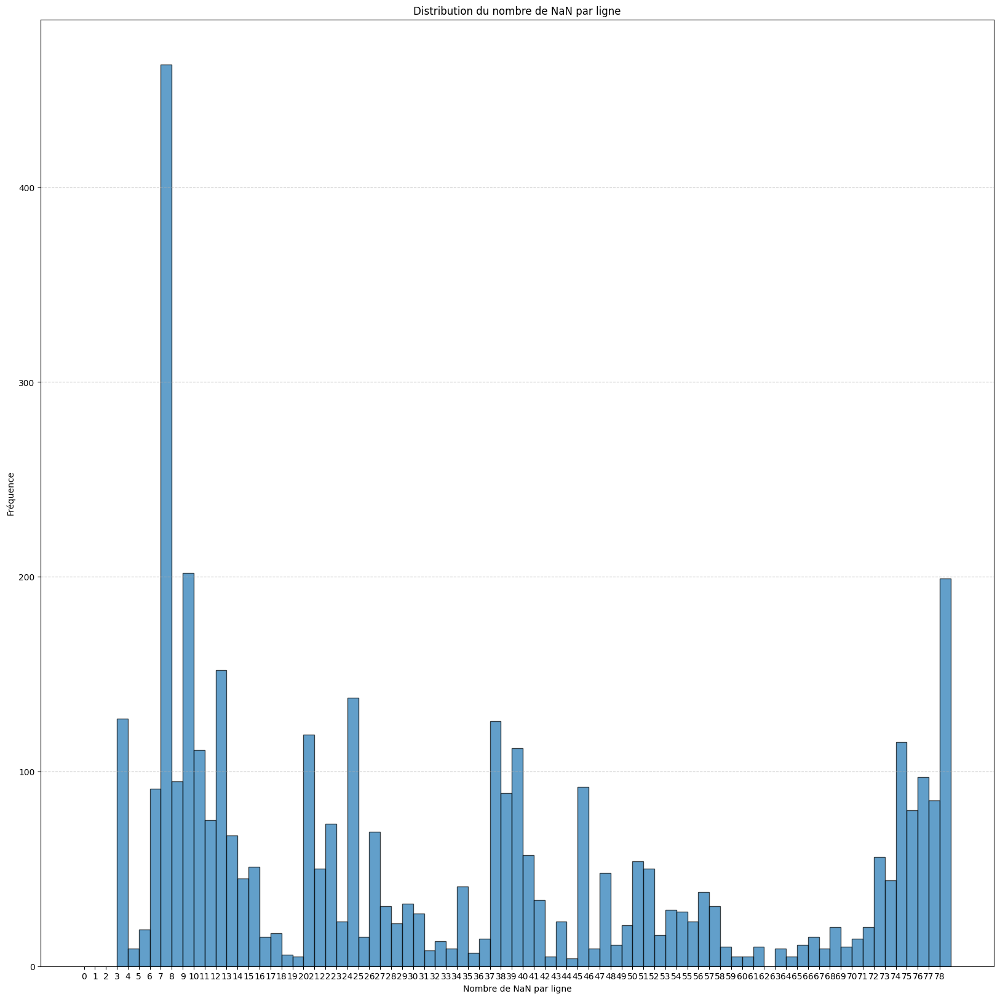

In [ ]:
# Compter le nombre de NaN par ligne
nan_par_ligne = df.isnull().sum(axis=1)

# Afficher la distribution sous forme d'histogramme
plt.figure(figsize=(20, 20))
plt.hist(nan_par_ligne, bins=range(nan_par_ligne.max() + 2), edgecolor='black', alpha=0.7)
plt.xlabel("Nombre de NaN par ligne")
plt.ylabel("Fréquence")
plt.title("Distribution du nombre de NaN par ligne")
plt.xticks(range(nan_par_ligne.max() + 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
valeurs_uniques = {col: df[col].unique() for col in df.select_dtypes(include=['object']).columns}

# Afficher le résultat
for col, valeurs in valeurs_uniques.items():
    print(f"Colonne {col} : {valeurs}")

Colonne Basic_Demos-Enroll_Season : ['Fall' 'Summer' 'Winter' 'Spring']
Colonne CGAS-Season : ['Winter' nan 'Fall' 'Summer' 'Spring']
Colonne Physical-Season : ['Fall' 'Summer' nan 'Spring' 'Winter']
Colonne Fitness_Endurance-Season : [nan 'Fall' 'Summer' 'Spring' 'Winter']
Colonne FGC-Season : ['Fall' 'Summer' nan 'Spring' 'Winter']
Colonne BIA-Season : ['Fall' 'Winter' nan 'Summer' 'Spring']
Colonne PAQ_A-Season : [nan 'Summer' 'Winter' 'Fall' 'Spring']
Colonne PAQ_C-Season : [nan 'Fall' 'Summer' 'Winter' 'Spring']
Colonne PCIAT-Season : ['Fall' 'Summer' nan 'Winter' 'Spring']
Colonne SDS-Season : [nan 'Fall' 'Summer' 'Winter' 'Spring']
Colonne PreInt_EduHx-Season : ['Fall' 'Summer' 'Winter' nan 'Spring']


In [ ]:
# Dictionnaire d'encodage des saisons
saisons_mapping = {'Spring': 0, 'Summer': 1, 'Fall': 2, 'Winter': 3}

# Liste des colonnes à modifier
colonnes_a_remplacer = [
    'Basic_Demos-Enroll_Season', 'CGAS-Season', 'Physical-Season',
    'Fitness_Endurance-Season', 'FGC-Season', 'BIA-Season','PAQ_A-Season',
    'PAQ_C-Season', 'PCIAT-Season', 'SDS-Season', 'PreInt_EduHx-Season'
]

# Remplacement des saisons par leurs valeurs numériques
for col in colonnes_a_remplacer:
    if col in df.columns:
        df[col] = df[col].map(saisons_mapping)

# Suppression de la colonne 'id' si elle existe
df_drop = df.drop(columns=['id'], errors='ignore')

Pourcentages de NAN pour les variables fortes corrélés (|Corrélation| > 0.9)

In [ ]:
import pandas as pd

# Calculer la matrice de corrélation
corr_matrix = df.corr()

# Liste pour stocker les paires de colonnes fortement corrélées
paires_corr_fortes = []

# Parcourir la matrice pour identifier les colonnes ayant une forte corrélation
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > 0.9:
            paires_corr_fortes.append((corr_matrix.index[i], corr_matrix.columns[j]))

# Extraire uniquement les colonnes concernées dans un nouveau DataFrame
colonnes_a_garder = set([col for paire in paires_corr_fortes for col in paire])
df_corr_forte = df[list(colonnes_a_garder)]

# Calcul du pourcentage de valeurs NaN présentes simultanément dans chaque paire de colonnes
nan_percentages = {}

for col1, col2 in paires_corr_fortes:
    nan_count = df[[col1, col2]].isnull().all(axis=1).sum()  # Nombre de lignes où les 2 colonnes ont NaN
    total_rows = len(df)
    nan_percentages[(col1, col2)] = (nan_count / total_rows) * 100  # Pourcentage

# Conversion en DataFrame pour affichage clair
df_nan_percent = pd.DataFrame(nan_percentages.items(), columns=['Paire de Colonnes', 'Pourcentage de NaN Simultané'])

# Affichage des résultats
print("Paires de colonnes fortement corrélées avec leur pourcentage de NaN simultané :")
df_nan_percent


Paires de colonnes fortement corrélées avec leur pourcentage de NaN simultané :


,Paire de Colonnes,Pourcentage de NaN Simultané
0,"(Basic_Demos-Enroll_Season, PreInt_EduHx-Season)",0.000000
1,"(Physical-Season, Fitness_Endurance-Season)",16.414141
2,"(Physical-BMI, BIA-BIA_BMI)",23.181818
3,"(Physical-Weight, Physical-Waist_Circumference)",22.247475
4,"(Physical-Waist_Circumference, BIA-BIA_BMI)",40.176768
5,"(Physical-Waist_Circumference, BIA-BIA_Fat)",40.176768
6,"(Fitness_Endurance-Season, PAQ_A-Season)",55.050505
7,"(Fitness_Endurance-Season, PAQ_A-PAQ_A_Total)",55.050505
8,"(FGC-FGC_SRL, FGC-FGC_SRR)",41.742424
9,"(BIA-BIA_BMC, BIA-BIA_BMR)",49.722222


In [ ]:
df2=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/test.csv')

In [ ]:
df2.shape

(20, 59)

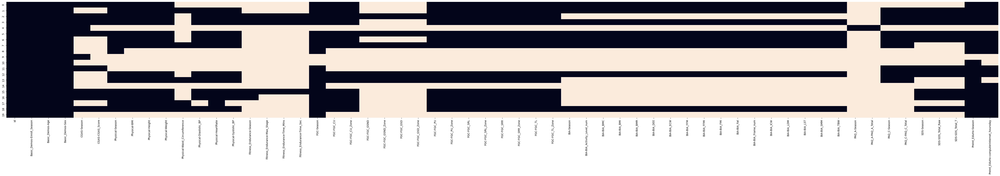

In [ ]:
plt.figure(figsize=(68, 8))
sns.heatmap(df2.isna(), cbar=False)
plt.show()

In [ ]:
pourcentage_valeurs_manquantes(df2)

,0
id,0.000000
Basic_Demos-Enroll_Season,0.000000
Basic_Demos-Age,0.000000
Basic_Demos-Sex,0.000000
CGAS-Season,0.252525
CGAS-CGAS_Score,0.303030
Physical-Season,0.151515
Physical-BMI,0.176768
Physical-Height,0.176768
Physical-Weight,0.176768


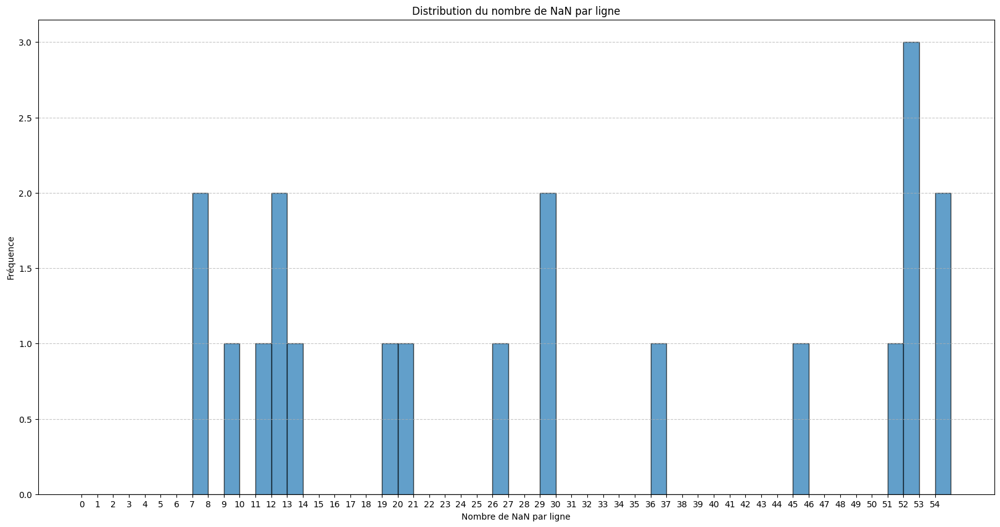

In [ ]:
# Compter le nombre de NaN par ligne
nan_par_ligne = df2.isnull().sum(axis=1)

# Afficher la distribution sous forme d'histogramme
plt.figure(figsize=(20, 10))
plt.hist(nan_par_ligne, bins=range(nan_par_ligne.max() + 2), edgecolor='black', alpha=0.7)
plt.xlabel("Nombre de NaN par ligne")
plt.ylabel("Fréquence")
plt.title("Distribution du nombre de NaN par ligne")
plt.xticks(range(nan_par_ligne.max() + 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Lecture du fichier Parquet
df = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/series_train.parquet/id=00115b9f/part-0.parquet')

# Affichage des 10 premières lignes sous forme de tableau
print(df.head(10))

   step         X         Y         Z      enmo     anglez  non-wear_flag  \
0     0  0.021536  0.022214 -1.022370  0.022853 -88.280762            0.0   
1     1  0.022005  0.022187 -1.019740  0.020231 -88.241707            0.0   
2     2  0.022240  0.022005 -1.019401  0.019893 -88.170067            0.0   
3     3  0.021589  0.022578 -1.018177  0.018667 -88.250031            0.0   
4     4  0.022005  0.023763 -1.014323  0.016848 -88.130775            0.0   
5     5  0.023281  0.025156 -1.015599  0.016680 -88.130775            0.0   
6     6  0.024818  0.027109 -1.015781  0.017497 -88.130775            0.0   
7     7  0.022578  0.024766 -1.015026  0.015589 -88.141670            0.0   
8     8  0.022318  0.024792 -1.015990  0.016576 -88.130775            0.0   
9     9  0.021953  0.024427 -1.015156  0.016997 -88.130585            0.0   

       light  battery_voltage     time_of_day  weekday  quarter  \
0  53.000000      4188.000000  56940000000000        4        3   
1  51.666668      

In [ ]:
df.shape

(43330, 13)

In [ ]:
pourcentage_valeurs_manquantes(df)

,0
step,0.0
X,0.0
Y,0.0
Z,0.0
enmo,0.0
anglez,0.0
non-wear_flag,0.0
light,0.0
battery_voltage,0.0
time_of_day,0.0


- Mesures d'accélération et orientation : les colonnes *X*, *Y*, *Z*, *enmo* et *anglez* fournissent des informations sur le mouvement et l'intensité de l'activité.
- Indicateur de port de l'appareil : *non-wear_flag* permet d'identifier les périodes où l'appareil n'est pas porté.
- Informations environnementales et temporelles : *light*, *battery_voltage*, *time_of_day*, *weekday* et *quarter* offrent un contexte sur les conditions de collecte.
- Référence temporelle : *relative_date_PCIAT* semble indiquer une date ou une référence relative pour le relevé.

# Extraction des caractéristiques globales (statistiques, fréquentielles, temporelles) - Données actigraphiques

1. **Prétraitement et segmentation**  
   - Filtre sur les périodes où le capteur n'est pas porté en se basant sur le champ *non-wear_flag*.  
   - Segmentation de la série en fenêtres temporelles fixes (5 minutes) afin d’obtenir des segments homogènes.

2. **Extraction de statistiques temporelles**  
   - Pour chaque segment : calcule des statistiques de base sur l’accélération (X, Y, Z) et sur l’ENMO (moyenne, écart-type, médiane, percentiles, minimum et maximum.)
   - Extraction des mesures de dispersion et de forme (skewness, kurtosis) pour capturer la distribution de l’activité.

3. **Analyse fréquentielle**  
   - Application d'une transformée de Fourier (ou une analyse par ondelettes) sur chaque segment pour obtenir la densité spectrale de puissance, identifier les fréquences dominantes et mesurer l'énergie du signal. Ces indicateurs permettent de différencier des périodes de mouvements rythmiques (comme la marche) de mouvements plus sporadiques.

4. **Caractéristiques dérivées du mouvement**  
   - Pour l’ENMO et *anglez*, calcule de la variance, l’entropie ou des indices de régularité qui quantifient la complexité du signal. Cela peut permettre après de voirs des motifs récurrents dans ces données qui pourraient être associés à différents types d’activité.

5. **Aspects temporels et contextuels**  
   - Intégration des informations sur l’heure de la journée, le jour de la semaine ou le trimestre afin de capter les variations circadiennes et saisonnières de l’activité.  


In [ ]:
import os
import glob
import re
from scipy.fft import rfft
from datetime import datetime
import multiprocessing
from functools import partial
import pyarrow.parquet as pq
import warnings
from tqdm import tqdm

# Ignorer les avertissements pour rendre l'affichage plus propre
warnings.filterwarnings('ignore')

# Configuration des paramètres principaux
data_dir = "/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/series_train.parquet"
output_file = "train_actigraphy_features_optimized.csv"
n_jobs = multiprocessing.cpu_count()  # Utiliser tous les cœurs disponibles

def extract_subject_id(file_path):
    """Extrait l'ID du sujet du chemin du fichier."""
    match = re.search(r"id=([^/\\]+)", file_path)
    if match:
        return match.group(1)
    return None

def convert_timestamps(df):
    """Convertit les colonnes de date en timestamps et ajoute des colonnes dérivées."""
    # Calcul du timestamp
    df['timestamp_sec'] = df['relative_date_PCIAT'] * 86400 + df['time_of_day'] / 1e9
    df['timestamp'] = pd.to_datetime(df['timestamp_sec'], unit='s')

    # Extraire l'heure, le jour, etc.
    df['hour'] = df['timestamp'].dt.hour
    df['minute'] = df['timestamp'].dt.minute
    df['fraction_hour'] = df['hour'] + df['minute'] / 60.0
    df['weekday'] = df['timestamp'].dt.dayofweek + 1  # 1-7, lundi-dimanche

    # Définir les périodes de la journée
    conditions = [
        (df['fraction_hour'] >= 5) & (df['fraction_hour'] < 12),
        (df['fraction_hour'] >= 12) & (df['fraction_hour'] < 18),
        (df['fraction_hour'] >= 18) & (df['fraction_hour'] < 22)
    ]
    choices = ['morning', 'afternoon', 'evening']
    df['day_period'] = np.select(conditions, choices, default='night')

    # Définir weekend vs jour de semaine
    df['is_weekend'] = np.where(df['weekday'].isin([6, 7]), 1, 0)

    return df

def compute_fft_features(enmo_series):
    """Calcule les caractéristiques FFT pour une série de valeurs ENMO."""
    if len(enmo_series) > 16:
        # Échantillonnage pour limiter la taille (si nécessaire)
        if len(enmo_series) > 1000:
            step = len(enmo_series) // 1000
            arr = enmo_series.values[::step]
        else:
            arr = enmo_series.values

        # Calcul FFT
        fft_vals = np.abs(rfft(arr))
        n = len(fft_vals)
        split = n // 3 if n >= 3 else 1

        # Calcul de l'énergie par bande
        low_energy = float(np.sum(fft_vals[:split]**2))
        mid_energy = float(np.sum(fft_vals[split:2*split]**2))
        high_energy = float(np.sum(fft_vals[2*split:]**2))

        return (low_energy, mid_energy, high_energy)
    return (np.nan, np.nan, np.nan)

def process_file(file_path, window_minutes=10):
    """Traite un fichier Parquet et extrait les caractéristiques."""
    try:
        # Extraction de l'ID du sujet
        subject_id = extract_subject_id(file_path)
        if not subject_id:
            return None

        # Lecture optimisée du fichier Parquet
        table = pq.read_table(file_path)
        df = table.to_pandas()

        # Filtrer les données non portées
        df = df[df['non-wear_flag'] == 0].copy()
        if df.empty:
            return pd.DataFrame({'id': [subject_id]})

        # Convertir les timestamps et ajouter des colonnes temporelles
        df = convert_timestamps(df)

        # Initialiser le dictionnaire de caractéristiques
        features = {'id': subject_id}

        # 1. Caractéristiques statistiques de base pour chaque colonne
        for col in ['X', 'Y', 'Z', 'enmo', 'anglez']:
            # Utiliser les méthodes numpy pour plus de rapidité
            values = df[col].values
            features[f'{col}_mean'] = np.mean(values)
            features[f'{col}_std'] = np.std(values)
            features[f'{col}_min'] = np.min(values)
            features[f'{col}_max'] = np.max(values)
            features[f'{col}_median'] = np.median(values)
            features[f'{col}_25th'] = np.percentile(values, 25)
            features[f'{col}_75th'] = np.percentile(values, 75)
            features[f'{col}_skew'] = float(pd.Series(values).skew())
            features[f'{col}_kurtosis'] = float(pd.Series(values).kurtosis())

        # 2. Pourcentage de temps où la montre n'est pas portée (déjà filtré)
        # features['non_wear_pct'] = df['non-wear_flag'].mean() * 100  # Toujours 0 car filtré

        # 3. Caractéristiques par période de la journée
        for period in ['morning', 'afternoon', 'evening', 'night']:
            period_data = df[df['day_period'] == period]
            if not period_data.empty:
                features[f'enmo_{period}_mean'] = period_data['enmo'].mean()
                features[f'enmo_{period}_std'] = period_data['enmo'].std()
                features[f'enmo_{period}_count'] = len(period_data)

        # 4. Caractéristiques par jour de la semaine
        for day in range(1, 8):
            day_data = df[df['weekday'] == day]
            if not day_data.empty:
                features[f'enmo_day{day}_mean'] = day_data['enmo'].mean()
                features[f'enmo_day{day}_count'] = len(day_data)

        # 5. Ratio weekend vs semaine
        weekday_data = df[df['is_weekend'] == 0]
        weekend_data = df[df['is_weekend'] == 1]

        if not weekday_data.empty:
            features['enmo_weekday_mean'] = weekday_data['enmo'].mean()
        if not weekend_data.empty:
            features['enmo_weekend_mean'] = weekend_data['enmo'].mean()

        if 'enmo_weekday_mean' in features and 'enmo_weekend_mean' in features and features['enmo_weekday_mean'] != 0:
            features['weekend_weekday_ratio'] = features['enmo_weekend_mean'] / features['enmo_weekday_mean']

        # 6. Activité nocturne pour estimation du sommeil
        night_condition = ((df['hour'] >= 22) & (df['hour'] <= 23)) | ((df['hour'] >= 0) & (df['hour'] < 6))
        night_data = df[night_condition]

        if not night_data.empty:
            features['night_activity_mean'] = night_data['enmo'].mean()
            features['night_activity_std'] = night_data['enmo'].std()
            features['night_records'] = len(night_data)

        # 7. Caractéristiques basées sur les fenêtres temporelles et FFT
        if window_minutes > 0:
            # Grouper par fenêtres temporelles
            df['window'] = df['timestamp'].dt.floor(f'{window_minutes}min')
            window_groups = df.groupby('window')

            # Calculer les caractéristiques pour chaque fenêtre
            window_features = []

            for _, window_df in window_groups:
                if len(window_df) > 10:  # Ignorer les fenêtres trop petites
                    window_feat = {}

                    # Caractéristiques de base pour la fenêtre
                    for col in ['X', 'Y', 'Z', 'enmo', 'anglez']:
                        values = window_df[col].values
                        window_feat[f'{col}_mean'] = np.mean(values)
                        window_feat[f'{col}_std'] = np.std(values)

                    # Caractéristiques FFT pour la fenêtre
                    fft_low, fft_mid, fft_high = compute_fft_features(window_df['enmo'])
                    window_feat['enmo_low_band_energy'] = fft_low
                    window_feat['enmo_mid_band_energy'] = fft_mid
                    window_feat['enmo_high_band_energy'] = fft_high

                    window_features.append(window_feat)

            # Moyenner les caractéristiques de toutes les fenêtres
            if window_features:
                window_df = pd.DataFrame(window_features)
                for col in window_df.columns:
                    features[f'window_{col}'] = window_df[col].mean()

        return pd.DataFrame([features])

    except Exception as e:
        print(f"Erreur lors du traitement du fichier {file_path}: {str(e)}")
        return pd.DataFrame({'id': [extract_subject_id(file_path)]})

def main():
    """Fonction principale pour traiter tous les fichiers et créer le dataset final."""
    print("Recherche des fichiers Parquet...")
    all_files = glob.glob(f"{data_dir}/*/part-0.parquet")
    print(f"Nombre total de fichiers trouvés: {len(all_files)}")

    # Traitement parallèle des fichiers
    print(f"Traitement des fichiers avec {n_jobs} processus...")

    # Utiliser tqdm pour afficher une barre de progression
    with multiprocessing.Pool(processes=n_jobs) as pool:
        results = list(tqdm(pool.imap(process_file, all_files), total=len(all_files)))

    # Combiner tous les résultats
    print("Combinaison des résultats...")
    actigraphy_features = pd.concat([r for r in results if r is not None], ignore_index=True)

    # Sauvegarder les résultats
    print(f"Sauvegarde des caractéristiques dans {output_file}...")
    actigraphy_features.to_csv(output_file, index=False)

    print(f"Extraction terminée. Caractéristiques pour {len(actigraphy_features)} participants.")
    print(f"Nombre de colonnes extraites: {actigraphy_features.shape[1]}")

    return actigraphy_features

if __name__ == "__main__":
    start_time = datetime.now()
    print(f"Début du traitement à {start_time}")
    actigraphy_features = main()
    end_time = datetime.now()
    elapsed = end_time - start_time
    print(f"Fin du traitement à {end_time}")
    print(f"Durée totale d'exécution: {elapsed}")

Début du traitement à 2025-03-03 02:55:05.396609
Recherche des fichiers Parquet...
Nombre total de fichiers trouvés: 996
Traitement des fichiers avec 2 processus...


100%|██████████| 996/996 [21:32<00:00,  1.30s/it]


Combinaison des résultats...
Sauvegarde des caractéristiques dans train_actigraphy_features_optimized.csv...
Extraction terminée. Caractéristiques pour 996 participants.
Nombre de colonnes extraites: 91
Fin du traitement à 2025-03-03 03:16:39.549106
Durée totale d'exécution: 0:21:34.152497


In [ ]:
actigraphy_features.shape

(996, 91)

Que 996 paricipants qui ont ces données actigraphiques

# Jointure gauche du train avec les features actigraphiques

In [ ]:
actigraphy_features = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/Actigraphy_features.csv')

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/train.csv')

In [ ]:
train = df.join(actigraphy_features.set_index('id'), on='id', how='left')

In [ ]:
train.to_csv('New_train.csv', index=False)

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/New_train.csv')

<Axes: >

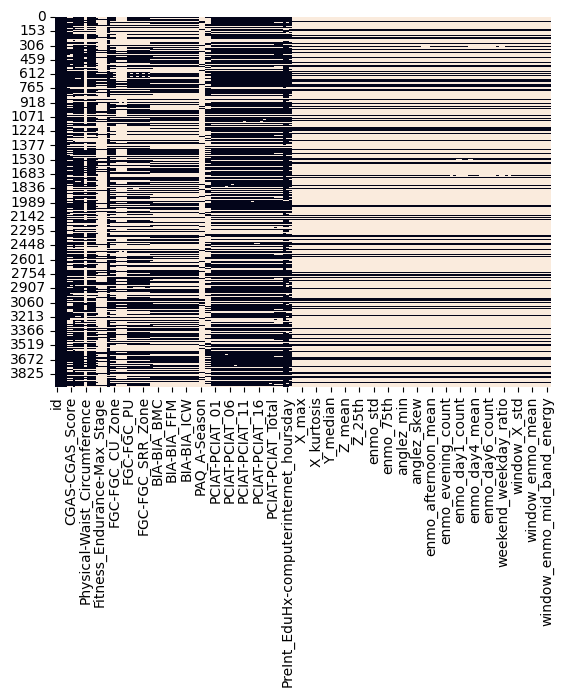

In [ ]:
sns.heatmap(train.isna(),cbar=False)

# Traitement des valeurs manquantes

## Porcentage des valeurs manquantes par colonne

In [ ]:
pd.set_option('display.max_rows', None)
def pourcentage_valeurs_manquantes(df):
    return (df.isnull().sum() / len(df)) * 100

pourcentage_valeurs_manquantes(train)

,0
id,0.000000
Basic_Demos-Enroll_Season,0.000000
Basic_Demos-Age,0.000000
Basic_Demos-Sex,0.000000
CGAS-Season,35.479798
CGAS-CGAS_Score,38.863636
Physical-Season,16.414141
Physical-BMI,23.686869
Physical-Height,23.560606
Physical-Weight,22.323232


## Valeurs manquantes par ligne

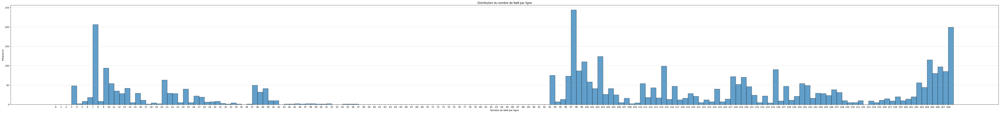

In [ ]:
# Compter le nombre de NaN par ligne
nan_par_ligne = train.isnull().sum(axis=1)

# Afficher la distribution sous forme d'histogramme
plt.figure(figsize=(79, 8))
plt.hist(nan_par_ligne, bins=range(nan_par_ligne.max() + 2), edgecolor='black', alpha=0.7)
plt.xlabel("Nombre de NaN par ligne")
plt.ylabel("Fréquence")
plt.title("Distribution du nombre de NaN par ligne")
plt.xticks(range(nan_par_ligne.max() + 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## Typologie des données

### Nombre de valeurs uniques par colonne

In [ ]:
pd.set_option('display.max_rows', None)
train.nunique()

,0
id,3960
Basic_Demos-Enroll_Season,4
Basic_Demos-Age,18
Basic_Demos-Sex,2
CGAS-Season,4
CGAS-CGAS_Score,59
Physical-Season,4
Physical-BMI,2658
Physical-Height,306
Physical-Weight,783


### Types des données

In [ ]:
train.dtypes

,0
id,object
Basic_Demos-Enroll_Season,object
Basic_Demos-Age,int64
Basic_Demos-Sex,int64
CGAS-Season,object
CGAS-CGAS_Score,float64
Physical-Season,object
Physical-BMI,float64
Physical-Height,float64
Physical-Weight,float64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import missingno as msno  # Pour visualiser les motifs de données manquantes

# Chargement des données
# Remplacez "chemin_vers_votre_fichier" par le chemin réel
train_df = train

# 1. Distribution de la variable cible "sii"
print("1. Distribution de la variable cible 'sii':")
print(train_df['sii'].value_counts(dropna=False).sort_index())
print("\nPourcentage par classe:")
print(train_df['sii'].value_counts(normalize=True, dropna=False).sort_index().round(3) * 100)

# Visualisation de la distribution (hors valeurs manquantes)
plt.figure(figsize=(10, 6))
sns.countplot(x='sii', data=train_df)
plt.title('Distribution de la variable cible (sii)')
plt.savefig('sii_distribution.png')
plt.close()

# 2. Analyse des schémas de valeurs manquantes
print("\n2. Motifs de valeurs manquantes:")
# Nombre de valeurs manquantes par observation
train_df['missing_count'] = train_df.isna().sum(axis=1)
print("Statistiques de valeurs manquantes par observation:")
print(train_df['missing_count'].describe())

# Visualisation de la distribution des valeurs manquantes par observation
plt.figure(figsize=(12, 6))
plt.hist(train_df['missing_count'], bins=30)
plt.title('Nombre de valeurs manquantes par observation')
plt.xlabel('Nombre de valeurs manquantes')
plt.ylabel('Nombre d\'observations')
plt.savefig('missing_values_per_row.png')
plt.close()

# Visualisation des motifs de valeurs manquantes
msno.matrix(train_df.sample(min(500, len(train_df))), figsize=(20, 10))
plt.title('Motifs de valeurs manquantes (échantillon)')
plt.savefig('missing_patterns.png')
plt.close()

# 3. Corrélations avec la variable cible (tenant compte des NaN)
# Créer un sous-ensemble avec seulement les lignes où 'sii' n'est pas NaN
subset_not_nan = train_df.dropna(subset=['sii'])

# Sélectionner uniquement les colonnes numériques
numeric_cols = subset_not_nan.select_dtypes(include=['number']).columns.tolist()
if 'missing_count' in numeric_cols:
    numeric_cols.remove('missing_count')  # Retirer notre colonne ajoutée

# Calculer les corrélations avec la cible sur ce sous-ensemble
print("\n3. Corrélations des variables numériques avec la cible (top 20):")
correlations = []
for col in numeric_cols:
    if col != 'sii' and subset_not_nan[col].notna().sum() > 0:  # Éviter les colonnes entièrement NaN
        # Calculer la corrélation Pearson et la p-value
        mask = subset_not_nan[col].notna()  # Masque pour les valeurs non-NaN
        if mask.sum() > 10:  # Au moins 10 valeurs non-NaN
            corr, p_value = stats.pearsonr(subset_not_nan.loc[mask, col], subset_not_nan.loc[mask, 'sii'])
            correlations.append((col, corr, p_value, mask.sum()))

# Trier par valeur absolue de corrélation et afficher
correlations.sort(key=lambda x: abs(x[1]), reverse=True)
corr_df = pd.DataFrame(correlations, columns=['Variable', 'Correlation', 'P-value', 'N'])
print(corr_df.head(20))

# 4. Analyse des données manquantes selon la présence de la variable cible
print("\n4. Analyse des valeurs manquantes par groupe:")
has_sii = train_df['sii'].notna()
print(f"Observations avec 'sii': {has_sii.sum()}")
print(f"Observations sans 'sii': {(~has_sii).sum()}")

print("\nValeurs manquantes moyennes par groupe:")
print(f"Avec 'sii': {train_df[has_sii]['missing_count'].mean():.2f} colonnes manquantes en moyenne")
print(f"Sans 'sii': {train_df[~has_sii]['missing_count'].mean():.2f} colonnes manquantes en moyenne")

# 5. Vérifier les différences entre les participants avec et sans 'sii'
# Pour les variables démographiques (Age, Sexe)
print("\n5. Comparaison des distributions démographiques:")

for col in ['Basic_Demos-Age', 'Basic_Demos-Sex']:
    if train_df[col].notna().sum() > 0:
        print(f"\nDistribution de {col}:")
        print("Avec 'sii':")
        print(train_df.loc[has_sii, col].value_counts(normalize=True).sort_index().round(3) * 100)
        print("Sans 'sii':")
        print(train_df.loc[~has_sii, col].value_counts(normalize=True).sort_index().round(3) * 100)

# 6. Présence des données d'accéléromètre vs. absence de 'sii'
# Supposant que les colonnes commençant par 'X_', 'Y_', 'Z_', 'enmo_' indiquent la présence de données d'accéléromètre
accel_columns = [col for col in train_df.columns if col.startswith(('X_', 'Y_', 'Z_', 'enmo_'))]
has_accel = train_df[accel_columns].notna().any(axis=1)

print("\n6. Présence des données d'accéléromètre:")
print(f"Total observations avec données d'accéléromètre: {has_accel.sum()}")
print(f"Observations avec 'sii' et données d'accéléromètre: {(has_sii & has_accel).sum()}")
print(f"Observations sans 'sii' mais avec données d'accéléromètre: {(~has_sii & has_accel).sum()}")
print(f"Observations avec 'sii' mais sans données d'accéléromètre: {(has_sii & ~has_accel).sum()}")

# 7. Analyse des corrélations entre variables pour détecter des groupes de variables similaires
# (utile pour l'imputation et la réduction de dimension)
print("\n7. Analyse des groupes de variables corrélées:")

# Sélectionner un sous-ensemble de colonnes numériques non-NaN pour l'analyse
# Choisir des colonnes avec moins de 50% de valeurs manquantes
selected_cols = [col for col in numeric_cols if train_df[col].isna().mean() < 0.5 and col != 'sii']
if len(selected_cols) > 5:  # S'assurer qu'il y a suffisamment de colonnes
    # Limiter à 30 colonnes maximum pour la visualisation
    if len(selected_cols) > 30:
        selected_cols = selected_cols[:30]

    # Calculer la matrice de corrélation
    corr_matrix = train_df[selected_cols].corr()

    # Visualiser la matrice de corrélation
    plt.figure(figsize=(16, 14))
    sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0, vmin=-1, vmax=1)
    plt.title('Matrice de corrélation des variables sélectionnées')
    plt.tight_layout()
    plt.savefig('correlation_matrix.png')
    plt.close()

    print(f"Matrice de corrélation générée pour {len(selected_cols)} variables sélectionnées")
    print("Voir le fichier 'correlation_matrix.png'")
else:

    print("Pas assez de colonnes avec moins de 50% de valeurs manquantes pour l'analyse de corrélation")

1. Distribution de la variable cible 'sii':
sii
0.0    1594
1.0     730
2.0     378
3.0      34
NaN    1224
Name: count, dtype: int64

Pourcentage par classe:
sii
0.0    40.3
1.0    18.4
2.0     9.5
3.0     0.9
NaN    30.9
Name: proportion, dtype: float64

2. Motifs de valeurs manquantes:
Statistiques de valeurs manquantes par observation:
count    3960.000000
mean      100.716919
std        53.770934
min         3.000000
25%        49.750000
50%       110.000000
75%       141.000000
max       168.000000
Name: missing_count, dtype: float64

3. Corrélations des variables numériques avec la cible (top 20):
             Variable  Correlation        P-value     N
0   PCIAT-PCIAT_Total     0.899681   0.000000e+00  2736
1      PCIAT-PCIAT_15     0.751399   0.000000e+00  2730
2      PCIAT-PCIAT_18     0.731112   0.000000e+00  2728
3      PCIAT-PCIAT_17     0.729867   0.000000e+00  2725
4      PCIAT-PCIAT_05     0.722722   0.000000e+00  2729
5      PCIAT-PCIAT_13     0.705679   0.000000e+00  2

La variable cible 'sii' présente 30.9% de valeurs manquantes, avec une distribution déséquilibrée:
- 40.3% de classe 0
- 18.4% de classe 1
- 9.5% de classe 2
- 0.9% de classe 3

Les observations sans valeur 'sii' ont significativement plus de valeurs manquantes (155.28 colonnes en moyenne) que celles avec 'sii' (76.31 colonnes).

996 observations avec données d'accéléromètre ont également des valeurs. Ces observations sont prioritaires à conserver

1740 observations avec 'sii' mais sans données d'accéléromètre

les 1224 observations sans 'sii'

Les variables PCIAT sont fortement corrélées avec 'sii' (corrélation jusqu'à 0.899)

Groupes de variables fortement corrélées entre elles :
   - Variables physiques: BMI, Height, Weight (fortes corrélations positives)
   - Variables BIA: forte corrélation entre BIA_BMC, BIA_BMR, BIA_FFM, BIA_FMI
   - Variables FGC: fortes corrélations entre les variables de même groupe (CU, PU, SRL, SRR, TL)

In [ ]:
valeurs_uniques = {col: train[col].unique() for col in train.select_dtypes(include=['object']).columns}

# Afficher le résultat
for col, valeurs in valeurs_uniques.items():
    print(f"Colonne {col} : {valeurs}")

Colonne id : ['00008ff9' '000fd460' '00105258' ... 'ffcd4dbd' 'ffed1dd5' 'ffef538e']
Colonne Basic_Demos-Enroll_Season : ['Fall' 'Summer' 'Winter' 'Spring']
Colonne CGAS-Season : ['Winter' nan 'Fall' 'Summer' 'Spring']
Colonne Physical-Season : ['Fall' 'Summer' nan 'Spring' 'Winter']
Colonne Fitness_Endurance-Season : [nan 'Fall' 'Summer' 'Spring' 'Winter']
Colonne FGC-Season : ['Fall' 'Summer' nan 'Spring' 'Winter']
Colonne BIA-Season : ['Fall' 'Winter' nan 'Summer' 'Spring']
Colonne PAQ_A-Season : [nan 'Summer' 'Winter' 'Fall' 'Spring']
Colonne PAQ_C-Season : [nan 'Fall' 'Summer' 'Winter' 'Spring']
Colonne PCIAT-Season : ['Fall' 'Summer' nan 'Winter' 'Spring']
Colonne SDS-Season : [nan 'Fall' 'Summer' 'Winter' 'Spring']
Colonne PreInt_EduHx-Season : ['Fall' 'Summer' 'Winter' nan 'Spring']


In [ ]:
# Dictionnaire d'encodage des saisons
saisons_mapping = {'Spring': 0, 'Summer': 1, 'Fall': 2, 'Winter': 3}

# Liste des colonnes à modifier
colonnes_a_remplacer = [
    'Basic_Demos-Enroll_Season', 'CGAS-Season', 'Physical-Season',
    'Fitness_Endurance-Season', 'FGC-Season', 'BIA-Season','PAQ_A-Season',
    'PAQ_C-Season', 'PCIAT-Season', 'SDS-Season', 'PreInt_EduHx-Season'
]

# Remplacement des saisons par leurs valeurs numériques
for col in colonnes_a_remplacer:
    if col in train.columns:
        train[col] = train[col].map(saisons_mapping)

In [ ]:
valeurs_uniques = {col: train[col].unique() for col in train.select_dtypes(include=['object']).columns}

# Afficher le résultat
for col, valeurs in valeurs_uniques.items():
    print(f"Colonne {col} : {valeurs}")

Colonne id : ['00008ff9' '000fd460' '00105258' ... 'ffcd4dbd' 'ffed1dd5' 'ffef538e']


In [ ]:
df = train.drop(columns=['id'], errors='ignore')

## Stratégie 1

1. **Séparation des observations** : Diviser les données en 3 groupes :
   - Groupe 1 : Observations avec accéléromètre et valeur SII
   - Groupe 2 : Observations avec SII mais sans accéléromètre (stratifiées par priorité)
   - Groupe 3 : Observations sans SII

3. **Identification des groupes de variables** : La fonction `identify_variable_groups` crée des groupes de variables selon la matrice de corrélation (PCIAT, physiques, BIA, FGC, etc.).

4. **Imputation des variables de base** : La fonction `impute_basic_variables` traite d'abord les variables démographiques et physiques, en utilisant les relations connues (ex : BMI = Weight/(Height²)).

5. **Imputation des variables PCIAT** : La fonction `impute_pciat_variables` utilise KNN pour imputer ces variables hautement corrélées avec la cible.

6. **Imputation des variables BIA** : La fonction `impute_bia_variables` utilise la régression linéaire et la stratification par âge et sexe.

7. **Imputation des variables FGC** : La fonction `impute_fgc_variables` traite chaque sous-groupe FGC séparément avec KNN.

8. **Création d'indicateurs** : La fonction `create_missing_indicators` génère des flags pour les données d'accéléromètre manquantes et les pourcentages de valeurs manquantes par groupe.

9. **Validation de l'imputation** : La fonction `validate_imputation` compare les distributions avant/après imputation avec des visualisations.

10. **Modélisation à deux niveaux** : La fonction `train_models` entraîne deux modèles :
    - Un modèle général pour toutes les observations avec SII
    - Un modèle spécifique pour les observations avec données d'accéléromètre

1. **Prétraitement et Sélection des Variables**  
   - **Nettoyage initial des données :**  
     - Suppression des colonnes ayant plus de 80 % de valeurs manquantes.  
     - Élimination des lignes comportant plus de 163 valeurs manquantes.  
   - **Identification des variables :**  
     - Les variables **catégorielles** sont définies comme celles présentant moins de 10 valeurs uniques (en tenant compte des NaN).  
     - Les variables **numériques** sont constituées du reste, à l’exception d’une éventuelle colonne d’identifiant.

2. **Création d’un Indicateur et Segmentation**  
   - **Détection d’accéléromètre :**  
     - Les colonnes dont le nom commence par "X_, Y_, anglez_...".  
     - Une nouvelle colonne `has_acc` est créée pour indiquer si une observation contient (ou non) des données d’accéléromètre.  
   - **Segmentation :**  
     - Les données sont segmentées en fonction de la présence (`has_acc = True`) ou non (`has_acc = False`) d’accéléromètre.

3. **Imputation des Variables Catégorielles par Cluster**  
   - **Guidage par clustering :**  
     - Un clustering (KMeans) est réalisé sur un ensemble de variables (privilégiant celles commençant par "PCIAT" ou, à défaut, quelques variables numériques) pour regrouper les observations en clusters homogènes.  
   - **Imputation par mode dans chaque cluster :**  
     - Pour chaque variable catégorielle manquante, le mode (la valeur la plus fréquente) est calculé au sein du cluster correspondant.  
     - Si le mode n’est pas identifiable pour un cluster donné, le mode global de la variable est utilisé.

4. **Imputation des Variables Numériques par IterativeImputer**  
   - **Méthode itérative multivariée :**  
     - Les variables numériques sont imputées à l’aide de l’`IterativeImputer`, qui exploite les relations entre variables pour estimer les valeurs manquantes de manière itérative.  
   - **Imputation segmentée :**  
     - L’imputation est réalisée séparément pour chaque segment défini par la présence d’accéléromètre, puis les résultats sont recombinés.

5. **Post-Traitement et Validation**  
   - **Clipping des valeurs physiques :**  
     - Certaines variables (par exemple, 'Physical-BMI' et 'CGAS-CGAS_Score') sont ajustées pour respecter des contraintes physiques réalistes en limitant leurs plages de valeurs.  
   - **Vérification statistique :**  
     - Pour les variables numériques, un test de Kolmogorov-Smirnov permet de comparer les distributions avant et après imputation.  
     - Pour les variables catégorielles, un test du Chi² est utilisé pour vérifier la cohérence des répartitions de fréquences.
---

**Bref, une stratégie hybride vise à préserver la structure interne des données en utilisant le clustering pour une imputation plus contextuelle des variables catégorielles, tout en exploitant une approche multivariée pour les variables numériques.**

### Implémentation et résultats

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import ks_2samp, chi2_contingency  # Import des tests statistiques

from sklearn.cluster import KMeans
from sklearn.experimental import enable_iterative_imputer  # Activation d'IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.preprocessing import StandardScaler

# Pour reproductibilité
np.random.seed(42)

# Suppression des colonnes avec >80% de NaN
# threshold_col = 0.8
# df = df.loc[:, df.isnull().mean() <= threshold_col]

# Suppression des lignes avec plus de 163 NaN
# threshold_row = 163
# df = df.loc[df.isnull().sum(axis=1) <= threshold_row]
# print("Dimensions après nettoyage (colonnes & lignes):", df.shape)

# 2. Identification des variables
# Variables catégorielles : moins de 10 valeurs uniques (on inclut les NaN dans ce comptage)
cat_cols = [col for col in df.columns if df[col].nunique(dropna=True) < 10]
# Variables numériques : toutes les colonnes restantes, sauf une éventuelle colonne d'identifiant
num_cols = [col for col in df.columns if col not in cat_cols and col not in ['id3960']]

print("Variables catégorielles potentielles :", cat_cols)
print("Variables numériques :", num_cols)

# 3. Création d'un indicateur de présence d'accéléromètre
accel_cols = [col for col in df.columns if col.startswith("X_")]
print("Variables d'accéléromètre détectées :", accel_cols)
df['has_acc'] = df[accel_cols].notnull().sum(axis=1) > 0
print("Distribution de 'has_acc':")
print(df['has_acc'].value_counts())

# 4. Segmentation selon la présence d'accéléromètre
segments = {}
for seg in df['has_acc'].unique():
    segments[seg] = df[df['has_acc'] == seg].copy()
    print(f"Segment has_acc={seg}: {segments[seg].shape[0]} observations.")

# 5. Clustering pour guider l’imputation catégorielle
def assign_clusters(data, features, n_clusters=4):
    # Utiliser seulement les lignes complètes sur les features de clustering
    data_clust = data[features].dropna()
    if data_clust.empty:
        return data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(data_clust)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)

    # Affecter les clusters aux lignes utilisées pour le clustering
    data.loc[data_clust.index, 'cluster'] = clusters
    return data

# Choix des features de clustering
pciat_features = [col for col in df.columns if col.startswith("PCIAT")]
if len(pciat_features) == 0:
    pciat_features = num_cols[:3]

df = assign_clusters(df, pciat_features, n_clusters=4)
print("Répartition des clusters :")
print(df['cluster'].value_counts())

# 6. Imputation des variables catégorielles par cluster (mode par cluster, sinon mode global)
def impute_categorical_cluster(data, cat_columns):
    data = data.copy()
    for col in cat_columns:
        for clust in data['cluster'].dropna().unique():
            idx = (data['cluster'] == clust) & (data[col].isnull())
            if idx.sum() > 0:
                mode_val = data.loc[data['cluster'] == clust, col].mode()
                if not mode_val.empty:
                    data.loc[idx, col] = mode_val.iloc[0]
                else:
                    # Si aucun mode dans le cluster, utiliser le mode global
                    global_mode = data[col].mode().iloc[0]
                    data.loc[idx, col] = global_mode
    return data

df = impute_categorical_cluster(df, cat_cols)

# 7. Imputation des variables numériques avec IterativeImputer
# Exclure 'has_acc' et 'cluster' de l'imputation
num_cols_impute = [col for col in num_cols if col not in ['has_acc', 'cluster']]

def impute_numeric_segment(data, num_columns):
    data = data.copy()
    # Conserver uniquement les colonnes qui ont au moins une valeur non nulle
    cols_to_impute = [col for col in num_columns if data[col].notnull().sum() > 0]
    if len(cols_to_impute) == 0:
        return data
    imputer = IterativeImputer(random_state=42, max_iter=10)
    imputed_array = imputer.fit_transform(data[cols_to_impute])
    imputed_df = pd.DataFrame(imputed_array, columns=cols_to_impute, index=data.index)
    data.update(imputed_df)
    return data

df_imputed = pd.DataFrame()
for seg_val, seg_df in segments.items():
    seg_df_imputed = impute_numeric_segment(seg_df, num_cols_impute)
    df_imputed = pd.concat([df_imputed, seg_df_imputed], axis=0)
df_imputed = df_imputed.sort_index()

# 8. Post-traitement : clipping pour respecter les contraintes physiques
if 'Physical-BMI' in df_imputed.columns:
    df_imputed['Physical-BMI'] = df_imputed['Physical-BMI'].clip(lower=0, upper=60)
if 'CGAS-CGAS_Score' in df_imputed.columns:
    df_imputed['CGAS-CGAS_Score'] = df_imputed['CGAS-CGAS_Score'].clip(lower=0, upper=100)

# 9. Comparaison statistique avant/après imputation

# Pour les variables numériques : test Kolmogorov-Smirnov
def compare_numeric(original, imputed, col):
    orig = original[col].dropna()
    imp = imputed[col].dropna()
    if len(orig) == 0 or len(imp) == 0:
        return None
    stat, p_value = ks_2samp(orig, imp)
    return stat, p_value

# Pour les variables catégorielles : test du Chi2
def compare_categorical(original, imputed, col):
    orig_counts = original[col].value_counts(dropna=True)
    imp_counts = imputed[col].value_counts(dropna=True)
    # Aligner les catégories
    all_categories = sorted(set(orig_counts.index).union(set(imp_counts.index)))
    orig_freq = np.array([orig_counts.get(cat, 0) for cat in all_categories])
    imp_freq = np.array([imp_counts.get(cat, 0) for cat in all_categories])
    if orig_freq.sum() == 0 or imp_freq.sum() == 0:
        return None
    chi2, p_value, _, _ = chi2_contingency([orig_freq, imp_freq])
    return chi2, p_value

print("\n=== Test statistique sur les variables numériques ===")
for col in num_cols_impute:
    result = compare_numeric(df, df_imputed, col)
    if result is not None:
        stat, p_value = result
        print(f"{col}: KS stat = {stat:.4f}, p-value = {p_value:.4f}")
    else:
        print(f"{col}: Pas assez de données pour le test.")

print("\n=== Test statistique sur les variables catégorielles ===")
for col in cat_cols:
    result = compare_categorical(df, df_imputed, col)
    if result is not None:
        chi2, p_value = result
        print(f"{col}: Chi2 = {chi2:.4f}, p-value = {p_value:.4f}")
    else:
        print(f"{col}: Pas assez de données pour le test.")

# 10. Sauvegarde du DataFrame imputé
df_imputed.to_csv('data_imputed.csv', index=False)
print("\nJeu de données imputé sauvegardé sous 'data_imputed.csv'")

Variables catégorielles potentielles : ['Basic_Demos-Enroll_Season', 'Basic_Demos-Sex', 'CGAS-Season', 'Physical-Season', 'Fitness_Endurance-Season', 'FGC-Season', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU_Zone', 'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL_Zone', 'BIA-Season', 'BIA-BIA_Activity_Level_num', 'BIA-BIA_Frame_num', 'PAQ_C-Season', 'PCIAT-Season', 'PCIAT-PCIAT_01', 'PCIAT-PCIAT_02', 'PCIAT-PCIAT_03', 'PCIAT-PCIAT_04', 'PCIAT-PCIAT_05', 'PCIAT-PCIAT_06', 'PCIAT-PCIAT_07', 'PCIAT-PCIAT_08', 'PCIAT-PCIAT_09', 'PCIAT-PCIAT_10', 'PCIAT-PCIAT_11', 'PCIAT-PCIAT_12', 'PCIAT-PCIAT_13', 'PCIAT-PCIAT_14', 'PCIAT-PCIAT_15', 'PCIAT-PCIAT_16', 'PCIAT-PCIAT_17', 'PCIAT-PCIAT_18', 'PCIAT-PCIAT_19', 'PCIAT-PCIAT_20', 'SDS-Season', 'PreInt_EduHx-Season', 'PreInt_EduHx-computerinternet_hoursday', 'sii', 'enmo_min']
Variables numériques : ['Basic_Demos-Age', 'CGAS-CGAS_Score', 'Physical-BMI', 'Physical-Height', 'Physical-Weight', 'Physical-Waist_Circumferen

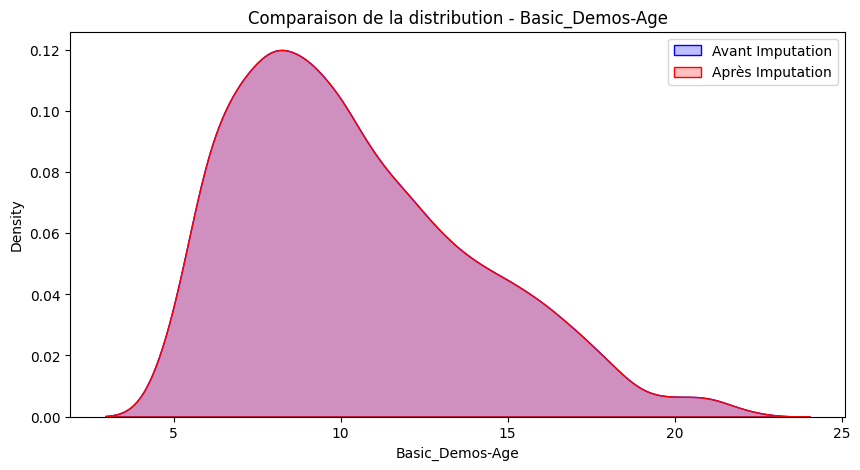

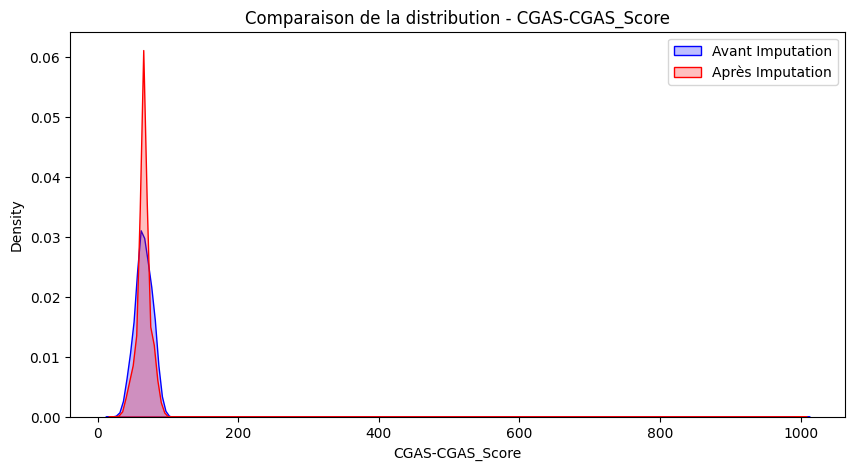

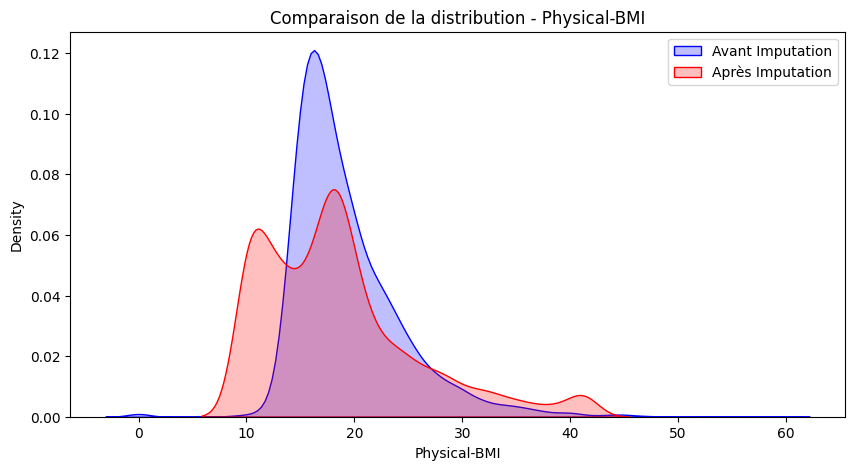

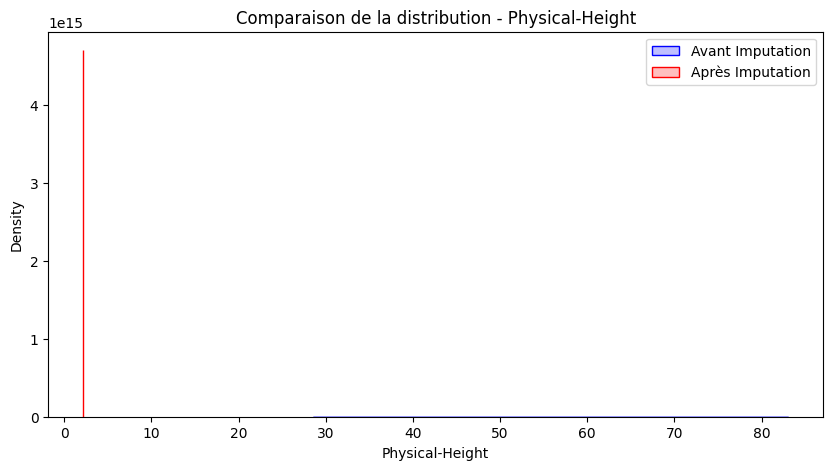

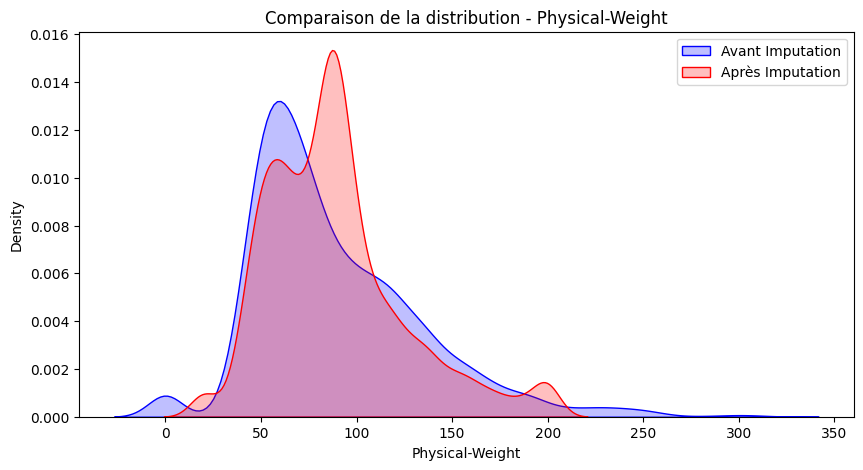

...

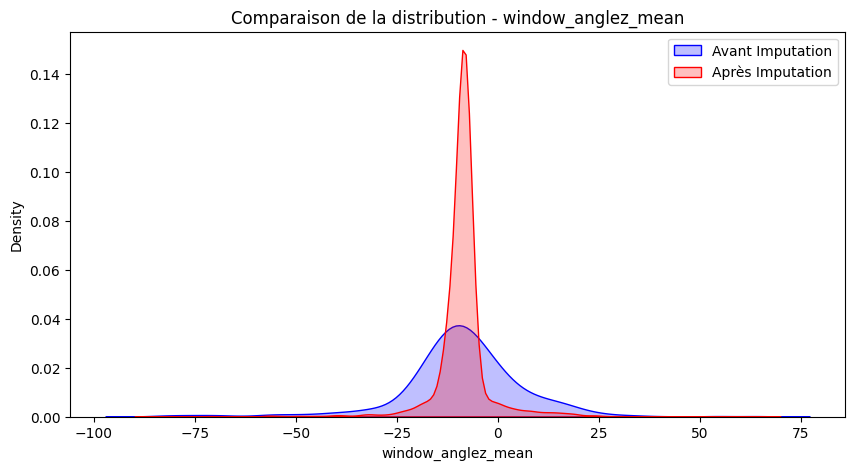

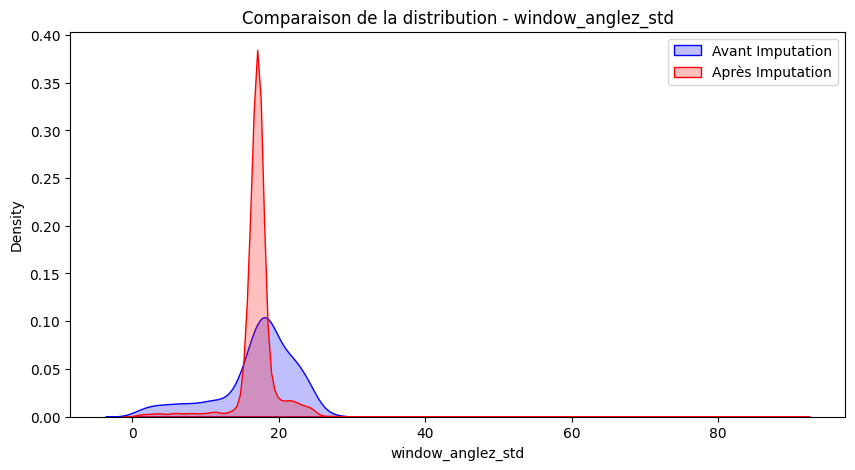

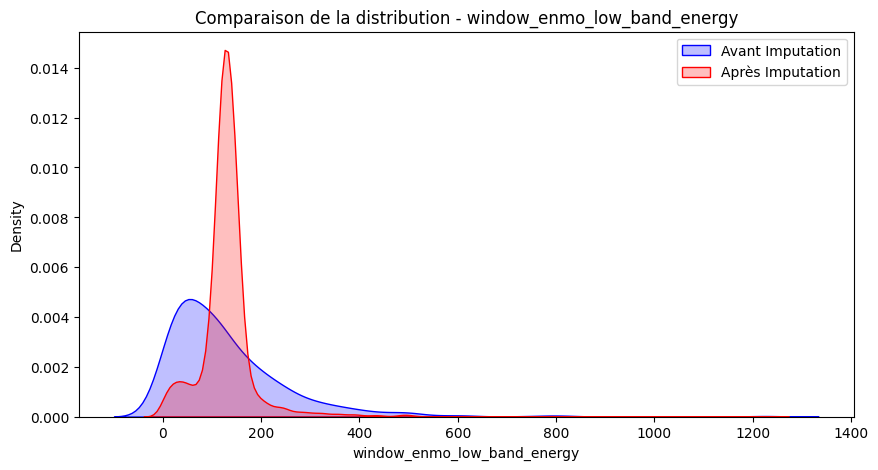

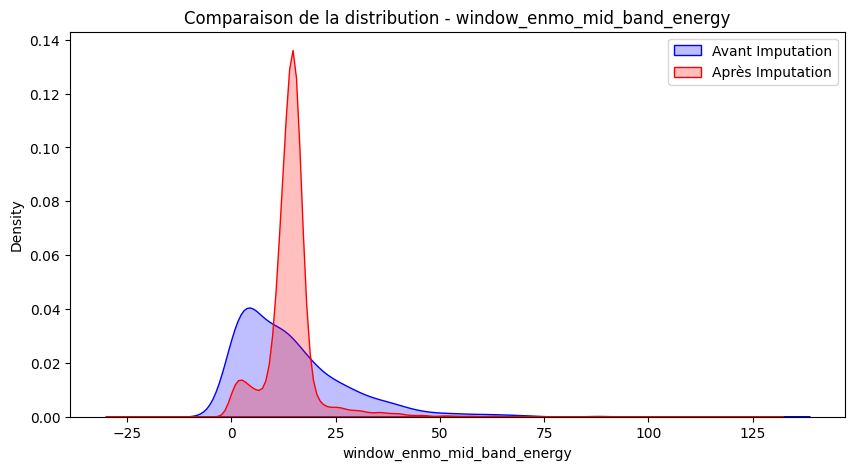

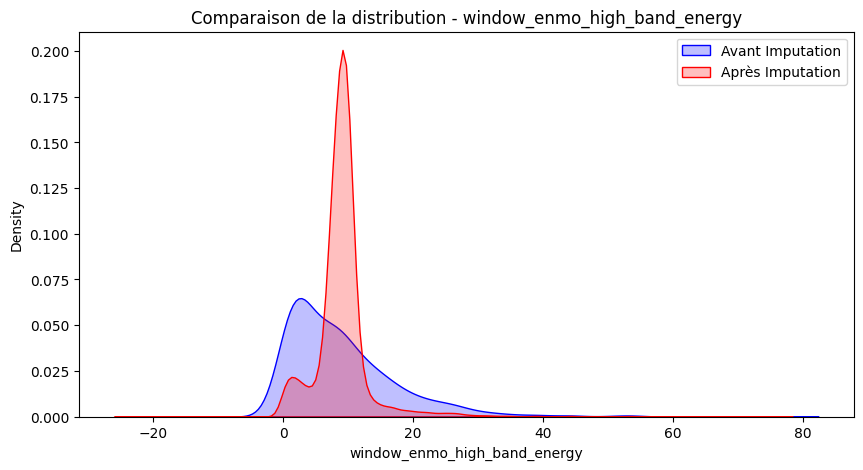

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def comparer_distributions(df_original, df_imputé, colonnes):
    """Compare la distribution de plusieurs colonnes avant et après imputation."""
    for colonne in colonnes:
        plt.figure(figsize=(10,5))
        sns.kdeplot(df_original[colonne], label="Avant Imputation", fill=True, color="blue")
        sns.kdeplot(df_imputé[colonne], label="Après Imputation", fill=True, color="red")
        plt.legend()
        plt.title(f"Comparaison de la distribution - {colonne}")
        plt.show()

colonnes_a_tester = numerical_features

comparer_distributions(df, df_imputed, colonnes_a_tester)


**1. Répartition de l'indicateur 'has_acc' et segmentation**  
2964 observations n'ont pas d'accéléromètre (has_acc=False) contre 996 qui en ont (has_acc=True). La présence d'un groupe majoritaire (environ 75 % sans accéléromètre) et d'un groupe minoritaire permet de segmenter les données de manière pertinente. Cela peut aider à adapter l’imputation, notamment pour tenir compte des différences potentielles dans la structure des données liées à la présence ou l'absence d'accéléromètre.

**2. Répartition des clusters**   
Les clusters obtenus présentent des tailles inégales : Cluster 1 (1003), Cluster 0 (770), Cluster 3 (640) et Cluster 2 (258). L'utilisation du clustering permet de guider l’imputation catégorielle en imputant par mode au sein de chaque cluster. Cependant, la taille réduite du Cluster 2 peut rendre le calcul du mode moins robuste, ce qui peut influencer la qualité de l’imputation pour ce groupe particulier.

**3. Tests statistiques sur les variables numériques (Test Kolmogorov-Smirnov)**  
Pour certaines variables certaines variables associées aux accéléromètres (ex. X_mean, X_std, etc.), le test KS donne une statistique nulle et un p-value de 1, ce qui indique que les distributions restent inchangées après imputation. En revanche, d'autres variables (par exemple, **CGAS-CGAS_Score**, **Physical-BMI**, et plusieurs mesures issues de BIA) présentent des KS stat non nulles avec des p-values de 0, indiquant une différence statistiquement significative entre la distribution originale et la distribution imputée.
Ces résultats montrent que, pour certaines variables, l’imputation a modifié la distribution des valeurs. La significativité statistique peut être en partie liée à la taille d’échantillon importante qui rend le test très sensible aux moindres différences.

**4. Tests statistiques sur les variables catégorielles (Test du Chi²)**  
Certaines variables, par exemple **CGAS-Season**, **Fitness_Endurance-Season** ou certaines modalités des variables FGC, présentent des différences significatives (p-value = 0), traduisant une modification des répartitions de fréquences.
L’imputation par mode réalisée au niveau des clusters a modifié les proportions observées. Ces différences pourraient être le reflet d’un manque de robustesse dans le calcul du mode au sein de clusters de taille réduite ou d’une forte hétérogénéité dans la distribution initiale des modalités.

## Stratégie 2

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Data_Use_Case Inwi/New_train.csv')

In [ ]:
threshold_col = 0.5  # 50%
df = df.loc[:, df.isnull().mean() <= threshold_col]

# Suppression des lignes avec plus de 166 valeurs manquantes
threshold_row = 160
df = df.loc[df.isnull().sum(axis=1) <= threshold_row]

In [ ]:
df.shape

(3960, 69)

### Distribution de la PCIAT-PCIAT_Total (Somme des variables  (forte corrélée) avec la cible sii

In [ ]:
wa = pd.DataFrame(data=df, columns=['PCIAT-PCIAT_Total', 'sii'])
wa[pd.notna(wa['PCIAT-PCIAT_Total'])]

,PCIAT-PCIAT_Total,sii
0,55.0,2.0
1,0.0,0.0
2,28.0,0.0
3,44.0,1.0
5,34.0,1.0
6,20.0,0.0
11,10.0,0.0
12,31.0,1.0
15,58.0,2.0
16,0.0,0.0


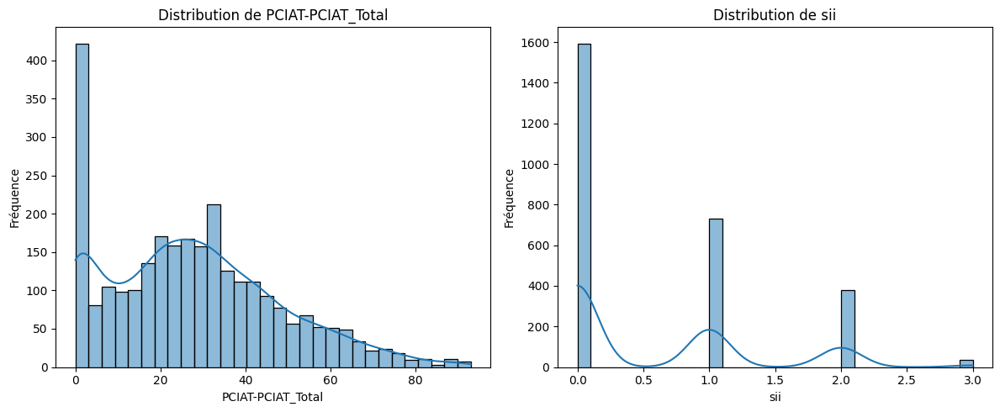

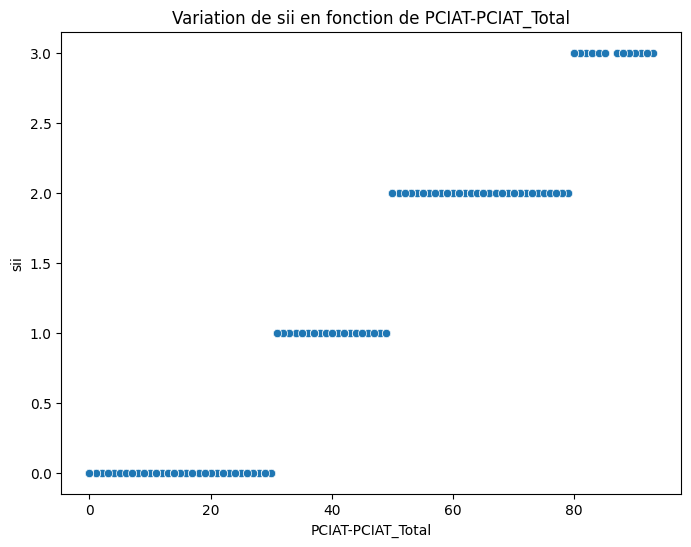

In [ ]:
wa_filtered = wa[pd.notna(wa['PCIAT-PCIAT_Total'])]
# Configuration de la figure
plt.figure(figsize=(12, 5))

# Distribution de PCIAT-PCIAT_Total
plt.subplot(1, 2, 1)
sns.histplot(wa_filtered['PCIAT-PCIAT_Total'], kde=True, bins=30)
plt.title('Distribution de PCIAT-PCIAT_Total')
plt.xlabel('PCIAT-PCIAT_Total')
plt.ylabel('Fréquence')

# Distribution de sii
plt.subplot(1, 2, 2)
sns.histplot(wa_filtered['sii'], kde=True, bins=30)
plt.title('Distribution de sii')
plt.xlabel('sii')
plt.ylabel('Fréquence')

plt.tight_layout()
plt.show()

# Tracer le nuage de points
plt.figure(figsize=(8, 6))
sns.scatterplot(data=wa_filtered, x='PCIAT-PCIAT_Total', y='sii')
plt.xlabel('PCIAT-PCIAT_Total')
plt.ylabel('sii')
plt.title('Variation de sii en fonction de PCIAT-PCIAT_Total')
plt.show()

Les 4 valeurs de la cible sii sont très bien distribués par rapports aux valeurs de PCIAT-PCIAT_Total, on peut exploité cela pour imputer les valeurs du sii.

- **Imputation (`min=0`)** :  
Suppose que chaque question non renseignée avait un score de **0**.
Cela donne une **borne basse réaliste** où les réponses non remplies ne contribuent pas au score total. Cela évite d’ajouter de l’information artificielle et biaiser la distribution.

- **Imputation (`max=5`)** :  
Suppose que chaque question non renseignée avait un score de **5**.
Cela donne une **borne haute**, où toutes les réponses manquantes sont au maximum possible.

- **L'imputation de `sii`** repose sur l'estimation de `PCIAT-PCIAT_Total` à partir de la moyenne (`Pciat_total_moy`). Ensuite, une règle simple permet de **catégoriser `sii`** :

| `PCIAT-PCIAT_Total` (moyenné) | `sii_pred` (imputé) |
|------------------------------|----------------------|
| ≤ 30                         | 0 (None)            |
| 31 - 49                      | 1 (Mild)            |
| 50 - 79                      | 2 (Moderate)        |
| ≥ 80                         | 3 (Severe)          |

### Imputation

In [ ]:
train_pciat_moy=df.copy()
test_pciat_moy=df.copy()
pciat_columns = [f'PCIAT-PCIAT_{i:02d}' for i in range(1, 21)]
train_pciat_moy['Pciat_total_min']=train_pciat_moy[pciat_columns].fillna(0).sum(axis=1)
train_pciat_moy['Pciat_total_max']=train_pciat_moy[pciat_columns].fillna(5).sum(axis=1)
train_pciat_moy['Pciat_total_moy']=(train_pciat_moy['Pciat_total_max']+train_pciat_moy['Pciat_total_min'])/2
train_pciat_moy.drop(columns=['Pciat_total_max','Pciat_total_min','PCIAT-PCIAT_Total', 'PCIAT-Season','sii'] + pciat_columns, inplace=True)

def Imputation_Sii(total):
    if total<=30:
        return 0  # Rien
    elif 31 <= total <= 49:
        return 1  # Doux
    elif 50 <= total <= 79:
        return 2  # Modéré
    else:
        return 3  # Sévère

train_pciat_moy['sii_pred']=train_pciat_moy['Pciat_total_moy'].apply(Imputation_Sii)
train_pciat_moy.drop('Pciat_total_moy',axis=1)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,BIA-BIA_LDM,BIA-BIA_LST,BIA-BIA_SMM,BIA-BIA_TBW,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii_pred
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.00,50.80,...,8.89536,38.9177,19.54130,32.6909,NaN,NaN,NaN,Fall,3.0,2
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.00,46.00,...,14.97400,39.4497,15.41070,27.0552,Fall,46.0,64.0,Summer,0.0,0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.50,75.60,...,NaN,NaN,NaN,NaN,Fall,38.0,54.0,Summer,2.0,0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.00,81.60,...,16.77900,58.9338,26.47980,45.9966,Summer,31.0,45.0,Winter,0.0,1
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
5,001f3379,Spring,13,1,Winter,50.0,Summer,22.279952,59.50,112.20,...,20.90200,79.6982,35.38040,63.1265,Summer,40.0,56.0,Spring,0.0,1
6,0038ba98,Fall,10,0,NaN,NaN,Fall,19.660760,55.00,84.60,...,16.02590,59.4643,26.19570,47.2211,Winter,27.0,40.0,Fall,3.0,0
7,0068a485,Fall,10,1,NaN,NaN,Fall,16.861286,59.25,84.20,...,17.47600,63.8954,28.76800,50.4767,NaN,NaN,NaN,Fall,2.0,2
8,0069fbed,Summer,15,0,NaN,NaN,Spring,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Summer,2.0,2
9,0083e397,Summer,19,1,Summer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


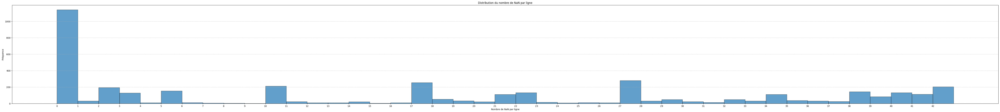

In [ ]:
# Compter le nombre de NaN par ligne
nan_par_ligne = train_pciat_moy.isnull().sum(axis=1)

# Afficher la distribution sous forme d'histogramme
plt.figure(figsize=(79, 8))
plt.hist(nan_par_ligne, bins=range(nan_par_ligne.max() + 2), edgecolor='black', alpha=0.7)
plt.xlabel("Nombre de NaN par ligne")
plt.ylabel("Fréquence")
plt.title("Distribution du nombre de NaN par ligne")
plt.xticks(range(nan_par_ligne.max() + 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
df.shape

(3960, 69)

In [ ]:
missing_train = train_pciat_moy.isna().mean() * 100
print(missing_train[missing_train >0])

CGAS-Season                               35.479798
CGAS-CGAS_Score                           38.863636
Physical-Season                           16.414141
Physical-BMI                              23.686869
Physical-Height                           23.560606
Physical-Weight                           22.323232
Physical-Diastolic_BP                     25.404040
Physical-HeartRate                        25.075758
Physical-Systolic_BP                      25.404040
FGC-Season                                15.505051
FGC-FGC_CU                                41.363636
FGC-FGC_CU_Zone                           42.373737
FGC-FGC_PU                                41.666667
FGC-FGC_PU_Zone                           42.651515
FGC-FGC_SRL                               41.792929
FGC-FGC_SRL_Zone                          42.752525
FGC-FGC_SRR                               41.742424
FGC-FGC_SRR_Zone                          42.702020
FGC-FGC_TL                                41.313131
FGC-FGC_TL_Z

In [ ]:
train_pciat_moy.nunique()

,0
id,3960
Basic_Demos-Enroll_Season,4
Basic_Demos-Age,18
Basic_Demos-Sex,2
CGAS-Season,4
CGAS-CGAS_Score,59
Physical-Season,4
Physical-BMI,2658
Physical-Height,306
Physical-Weight,783


In [ ]:
pourcentage_valeurs_manquantes(train_pciat_moy2)

,0
id,0.0
Basic_Demos-Enroll_Season,0.0
Basic_Demos-Age,0.0
Basic_Demos-Sex,0.0
CGAS-Season,0.0
CGAS-CGAS_Score,0.0
Physical-Season,0.0
Physical-BMI,0.0
Physical-Height,0.0
Physical-Weight,0.0


In [ ]:
train_pciat_moy2.dtypes

,0
id,object
Basic_Demos-Enroll_Season,object
Basic_Demos-Age,int64
Basic_Demos-Sex,int64
CGAS-Season,object
CGAS-CGAS_Score,float64
Physical-Season,object
Physical-BMI,float64
Physical-Height,float64
Physical-Weight,float64


In [ ]:
train_pciat_moy2.head()

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,FGC-FGC_TL,FGC-FGC_TL_Zone,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,Pciat_total_moy,sii_pred,Age_Group
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,0.000019,2.150430,...,6.0,1.0,Spring,39.0,55.0,Fall,3.0,55.0,2,Children
1,000fd460,Summer,9,0,Spring,65.0,Fall,14.035590,0.000020,1.947240,...,3.0,0.0,Fall,46.0,64.0,Summer,0.0,0.0,0,Children
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,0.000024,3.200246,...,5.0,0.0,Fall,38.0,54.0,Summer,2.0,28.0,0,Children
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,0.000023,3.454234,...,7.0,1.0,Summer,31.0,45.0,Winter,0.0,44.0,1,Children
4,0016bb22,Spring,18,1,Summer,65.0,Spring,15298.999868,0.000026,5.282946,...,11.0,1.0,Spring,39.0,55.0,Spring,2.0,50.0,2,Adolescents


In [ ]:
# Dictionnaire d'encodage des saisons
saisons_mapping = {'Spring': 0, 'Summer': 1, 'Fall': 2, 'Winter': 3}

# Liste des colonnes à modifier
colonnes_a_remplacer = [
    'Basic_Demos-Enroll_Season', 'CGAS-Season', 'Physical-Season',
    'Fitness_Endurance-Season', 'FGC-Season', 'BIA-Season','PAQ_A-Season',
    'PAQ_C-Season', 'PCIAT-Season', 'SDS-Season', 'PreInt_EduHx-Season'
]

# Remplacement des saisons par leurs valeurs numériques
for col in colonnes_a_remplacer:
    if col in train_pciat_moy.columns:
        train_pciat_moy[col] = train_pciat_moy[col].map(saisons_mapping)

# Suppression de la colonne 'id' si elle existe
df_drop = train_pciat_moy.drop(columns=['id'], errors='ignore')

In [ ]:
# Dictionnaire d'encodage des saisons
saisons_mapping = {'Children': 0, 'Adolescents': 1, 'Adults': 2}

df_drop['Age_Group'] = df_drop['Age_Group'].map(saisons_mapping)

In [ ]:
df_drop.dtypes

,0
Basic_Demos-Enroll_Season,int64
Basic_Demos-Age,int64
Basic_Demos-Sex,int64
CGAS-Season,int64
CGAS-CGAS_Score,float64
Physical-Season,int64
Physical-BMI,float64
Physical-Height,float64
Physical-Weight,float64
Physical-Diastolic_BP,float64


In [ ]:
threshold_col = 0.4  # 50%
df_drop = df_drop.loc[:, df_drop.isnull().mean() <= threshold_col]

### 1. Imputation des variables catégorielles (Saisons)
- **Objectif :** Remplacer les valeurs manquantes dans les colonnes liées aux saisons par la valeur la plus fréquente (mode).
- **Méthode :** Pour chaque colonne listée (ex. « CGAS-Season », « Physical-Season », etc.), la fonction calcule le mode et l’utilise pour remplir les NaN.

### 2. Imputation de variables numériques simples
- **Exemple :** La colonne « CGAS-CGAS_Score » est imputée en remplaçant les valeurs manquantes par la médiane de la colonne.
- **Raison :** La médiane est moins sensible aux valeurs extrêmes et permet une estimation robuste pour les données numériques.

### 3. Création de groupes démographiques
- **Objectif :** Segmenter les individus en groupes d’âge (« Children », « Adolescents », « Adults ») à partir de la colonne d’âge.
- **Utilisation :** Ces groupes, combinés avec le sexe, sont utilisés comme clés de regroupement pour des imputations plus ciblées sur des populations homogènes.

### 4. Imputation des variables physiques (Poids et Taille)
- **Étape 4a :**  
  - **Groupe par âge et sexe :** Pour « Physical-Weight » et « Physical-Height », on remplit d’abord les valeurs manquantes en utilisant la médiane calculée au sein de chaque groupe (âge + sexe).
- **Étape 4b :**  
  - **Groupe par âge uniquement :** Pour les cas où la première imputation ne suffit pas, un regroupement uniquement par âge est utilisé pour imputer les valeurs restantes.
- **Étape 4c :**  
  - **Fallback global :** Si des valeurs manquent encore, on applique la médiane globale de la colonne.

### 5. Calcul de l’Indice de Masse Corporelle (BMI)
- **Calcul :** Pour les lignes où le BMI est manquant, celui-ci est recalculé selon la formule :
$
  \text{BMI} = \frac{\text{Poids (kg)}}{(\text{Taille (m)})^2}
$

### 6. Imputation d’autres paramètres physiques (Pression artérielle, Fréquence cardiaque)
- **Méthode similaire :**  
  - **Groupe par âge et sexe :** Imputation initiale avec la médiane au sein des groupes.
  - **Groupe par âge uniquement :** Utilisé comme solution de repli pour combler les valeurs manquantes restantes.
  - **Fallback global :** Enfin, les valeurs résiduelles sont remplacées par la médiane globale.

### 7. Imputation des variables de forme physique (Fitness)
- **Sélection :** Les colonnes relatives à la forme (contenant « FGC » et excluant « FGC-Season ») sont traitées.
- **Approche :**  
  - D’abord, on impute en utilisant la médiane par groupe (âge et sexe).  
  - Ensuite, toute valeur toujours manquante est remplacée par la médiane globale.

### 8. Imputation des variables liées au sommeil (Sleep features)
- **Groupe élargi :**  
  - Les imputations pour « SDS-SDS_Total_Raw » et « SDS-SDS_Total_T » se basent sur un regroupement plus complet incluant âge, sexe, saisons, paramètres physiques et variables de fitness.
- **Processus en plusieurs niveaux :**  
  - **Première passe :** Imputation par groupe élargi.
  - **Deuxième passe :** Repli sur le regroupement par âge uniquement.
  - **Fallback global :** Finalement, les valeurs restantes sont imputées par la médiane globale.

### 9. Imputation pour l’usage d’ordinateur/internet
- **Méthode mixte :**  
  - Pour la colonne « PreInt_EduHx-computerinternet_hoursday », une fonction `apply` est utilisée pour vérifier si la valeur est présente.
  - **Sinon :**  
    - Elle est imputée par la médiane du groupe d’âge correspondant.
    - Si cela ne suffit pas, une dernière imputation globale avec la médiane est effectuée.

In [ ]:
def imputer(df):
    # Étape 1 : Imputer les colonnes de saison catégorielles en utilisant le mode
    fill_with_mode = ['CGAS-Season', 'Physical-Season', 'FGC-Season', 'SDS-Season', 'PreInt_EduHx-Season']
    for col in fill_with_mode:
        if col in df.columns:
            df[col] = df[col].fillna(df[col].mode()[0])

    # Étape 2 : Imputer les colonnes numériques avec la médiane
    df['CGAS-CGAS_Score'] = df['CGAS-CGAS_Score'].fillna(df['CGAS-CGAS_Score'].median())

    # Étape 3 : Regrouper par tranche d'âge et sexe
    df['Age_Group'] = pd.cut(df['Basic_Demos-Age'], bins=[4, 12, 18, 22], labels=['Children', 'Adolescents', 'Adults'])
    group_cols = ['Age_Group', 'Basic_Demos-Sex']

    # Étape 4 : Imputer 'Physical-Weight' et 'Physical-Height'
    for col in ['Physical-Weight', 'Physical-Height']:
        # Étape 4a : Imputer en se basant sur la tranche d'âge et le sexe
        df[col] = df.groupby(group_cols)[col].transform(lambda x: x.fillna(x.median()))

        # Étape 4b : Recourir à la médiane par tranche d'âge uniquement pour les lignes avec encore des valeurs manquantes
        missing_vals_mask = df[col].isna()  # Créer un masque pour les valeurs NaN
        df.loc[missing_vals_mask, col] = df.loc[missing_vals_mask].groupby('Age_Group')[col].transform(lambda x: x.fillna(x.median()))

        # Étape 4c : Recourir en dernier à la médiane globale uniquement pour les valeurs manquantes restantes
        df.loc[df[col].isna(), col] = df[col].median()  # Appliquer uniquement la médiane globale aux valeurs manquantes restantes


    # Étape 5 : Calculer l'IMC en utilisant les valeurs disponibles ou imputées pour le poids et la taille

        # Conversion de la taille en mètres et du poids en kilogrammes comme requis pour le calcul de l'IMC
        df['Physical-Weight'] = df['Physical-Weight'] * 0.453592
        df['Physical-Height'] = df['Physical-Height'] * 0.0254

    df.loc[df['Physical-BMI'].isna(), 'Physical-BMI'] = df.apply(
        lambda row: row['Physical-Weight'] / (row['Physical-Height'] ** 2), axis=1
    )

    # Étape 6 : Imputer les autres caractéristiques physiques (pression artérielle diastolique, fréquence cardiaque, etc.)
    phys_cols = ['Physical-Diastolic_BP', 'Physical-HeartRate', 'Physical-Systolic_BP']
    for col in phys_cols:
        # Étape 6a : Imputer en se basant sur la tranche d'âge et le sexe
        df[col] = df.groupby(group_cols)[col].transform(lambda x: x.fillna(x.median()))

        # Étape 6b : Recourir à la médiane par tranche d'âge pour les valeurs manquantes
        missing_vals_mask = df[col].isna()  # Créer un masque pour les valeurs NaN
        df.loc[missing_vals_mask, col] = df.loc[missing_vals_mask].groupby('Age_Group')[col].transform(lambda x: x.fillna(x.median()))

        # Étape 6c : Recourir en dernier à la médiane globale pour les lignes avec des valeurs manquantes restantes
        df[col] = df[col].fillna(df[col].median())

    # Imputation des colonnes de condition physique
    fitness_cols = [i for i in train_pciat_moy.columns if 'FGC' in i and i != 'FGC-Season']
    for col in fitness_cols:
        df[col] = df.groupby(group_cols)[col].transform(lambda x: x.fillna(x.median()))
        df[col] = df[col].fillna(df[col].median())

    # Imputation des caractéristiques liées au sommeil
    group_cols_sleep = ['Age_Group', 'Basic_Demos-Sex', 'CGAS-Season', 'Physical-Season',
                  'Physical-Diastolic_BP', 'Physical-HeartRate', 'Physical-Systolic_BP'] + fitness_cols

    for col in ['SDS-SDS_Total_Raw', 'SDS-SDS_Total_T']:
        # Calculer uniquement pour les lignes où la valeur de la colonne est manquante
        missing_vals_mask = df[col].isna()  # Créer un masque pour les valeurs NaN

        # Imputer en se basant sur tous les groupes pertinents, y compris SII, pour les valeurs manquantes
        df.loc[missing_vals_mask, col] = df.loc[missing_vals_mask].groupby(group_cols_sleep)[col].transform(lambda x: x.fillna(x.median()))

        # Solution de repli en cas de non-concordance de certaines conditions
        missing_vals_mask = df[col].isna()
        df.loc[missing_vals_mask, col] = df.loc[missing_vals_mask].groupby('Age_Group')[col].transform(lambda x: x.fillna(x.median()))
        df[col] = df[col].fillna(df[col].median())

    # Imputer 'PreInt_EduHx-computerinternet_hoursday' en utilisant la tranche d'âge et SII
    df['PreInt_EduHx-computerinternet_hoursday'] = df.apply(
        lambda row: row['PreInt_EduHx-computerinternet_hoursday'] if not pd.isna(row['PreInt_EduHx-computerinternet_hoursday']) else
        df.groupby(['Age_Group'])['PreInt_EduHx-computerinternet_hoursday'].median().get(
            (row['Age_Group']), np.nan), axis=1)

    # Recourir à la valeur médiane en solution de repli
    df['PreInt_EduHx-computerinternet_hoursday'].fillna(df['PreInt_EduHx-computerinternet_hoursday'].median(), inplace=True)

    return df

dff = imputer(df_drop)


<ipython-input-93-5668fc81fa7d>:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df[col] = df.groupby(group_cols)[col].transform(lambda x: x.fillna(x.median()))
<ipython-input-93-5668fc81fa7d>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.loc[missing_vals_mask, col] = df.loc[missing_vals_mask].groupby('Age_Group')[col].transform(lambda x: x.fillna(x.median()))
<ipython-input-93-5668fc81fa7d>:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default

In [ ]:
pourcentage_valeurs_manquantes(dff)

,0
Basic_Demos-Enroll_Season,0.0
Basic_Demos-Age,0.0
Basic_Demos-Sex,0.0
CGAS-Season,0.0
CGAS-CGAS_Score,0.0
Physical-Season,0.0
Physical-BMI,0.0
Physical-Height,0.0
Physical-Weight,0.0
Physical-Diastolic_BP,0.0


# Modélisation prédéctive

In [ ]:
dff.dtypes

,0
Basic_Demos-Enroll_Season,int64
Basic_Demos-Age,int64
Basic_Demos-Sex,int64
CGAS-Season,int64
CGAS-CGAS_Score,float64
Physical-Season,int64
Physical-BMI,float64
Physical-Height,float64
Physical-Weight,float64
Physical-Diastolic_BP,float64


In [ ]:
dff.to_csv('dff.csv', index=False)

In [ ]:
dff=pd.read_csv('dff.csv')

In [ ]:
dff["sii_pred"].value_counts()

,count
sii_pred,
2,1605
0,1590
1,729
3,36


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

def apply_smote_multiclass(df, target_column='sii_pred'):
    """
    Applique SMOTE en preprocessing les données catégorielles

    Parameters:
    -----------
    df : pandas DataFrame
        Le DataFrame contenant les données
    target_column : str
        Nom de la colonne cible

    Returns:
    --------
    DataFrame rééchantillonné
    """
    # Copie du DataFrame pour éviter les modifications
    df = df.copy()

    # Identification des colonnes
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns
    numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns.drop(target_column)

    # Encodage des colonnes catégorielles
    label_encoders = {}
    for col in categorical_columns:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))
        label_encoders[col] = le

    # Séparation des features et de la target
    X = df.drop(columns=[target_column])
    y = df[target_column]

    # Normalisation des données numériques
    scaler = StandardScaler()
    X_scaled = X.copy()
    X_scaled[numeric_columns] = scaler.fit_transform(X[numeric_columns])

    # Split des données
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=0.2, stratify=y, random_state=42
    )

    # SMOTE
    smote = SMOTE(random_state=42, sampling_strategy='auto')
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

    # Reconstruction du DataFrame
    df_resampled = pd.DataFrame(
        X_resampled,
        columns=X.columns
    )
    df_resampled[target_column] = y_resampled

    # Décodage des colonnes catégorielles si nécessaire
    for col, le in label_encoders.items():
        df_resampled[col] = le.inverse_transform(df_resampled[col].astype(int))

    # Affichage des distributions
    print("Distribution originale:")
    print(y.value_counts())
    print("\nDistribution après SMOTE:")
    print(pd.Series(y_resampled).value_counts())

    return df_resampled

# Exemple d'utilisation
dfe = apply_smote_multiclass(dff, target_column='sii_pred')

Distribution originale:
sii_pred
2    1605
0    1590
1     729
3      36
Name: count, dtype: int64

Distribution après SMOTE:
sii_pred
2    1284
1    1284
0    1284
3    1284
Name: count, dtype: int64


In [ ]:
# Créer un objet LabelEncoder
le = LabelEncoder()

# Appliquer l'encodage
dfe['Age_Group_encoded'] = le.fit_transform(dfe['Age_Group'])

In [ ]:
dfe= dfe.drop(columns=['Age_Group'])

<Axes: >

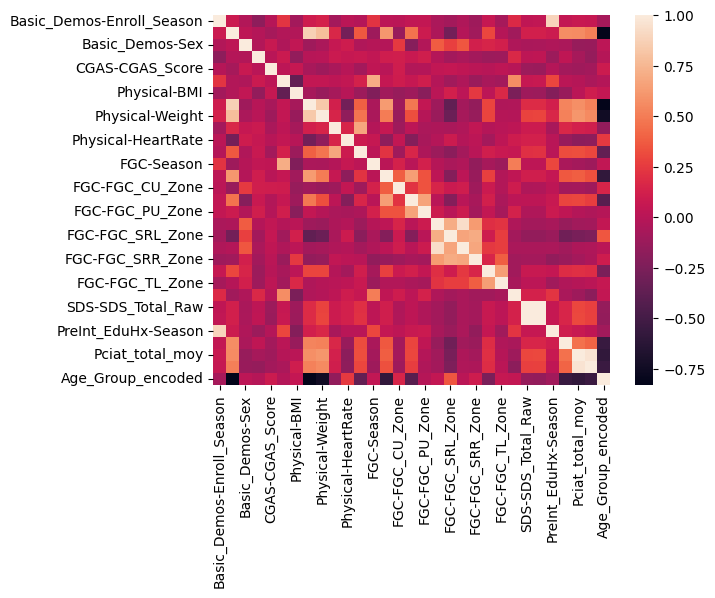

In [ ]:
sns.heatmap(dfe[dfe.columns].corr())

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(.95)

In [ ]:
pca.fit(X_train)
pca.fit(X_test)

PCA(n_components=0.95)

In [ ]:
pca.n_components_

20

In [ ]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
X = dfe.drop(["sii_pred"], axis = 1)
y = dfe["sii_pred"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
variables_to_drop = ['Pciat_total_moy','Basic_Demos-Age']

    # Suppression des variables
df_cleaned = dfe.drop(columns=variables_to_drop)

In [ ]:
X = df_cleaned.drop(["sii_pred"], axis = 1)
y = df_cleaned["sii_pred"]
scaler = StandardScaler()
X = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [ ]:
import numpy as np
from sklearn.metrics import (
    cohen_kappa_score,
    mean_absolute_error,
    mean_squared_error
)
from scipy.stats import spearmanr
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif

# Définition d'une fonction d'évaluation qui affiche uniquement les 4 métriques
def evaluation_model(model, X_train, X_test, y_train, y_test, title=None):
    """
    Affiche uniquement les métriques :
    - Quadratic Weighted Kappa
    - Mean Absolute Error (MAE)
    - Root Mean Squared Error (RMSE)
    - Spearman's Rank Correlation Coefficient
    """
    # Entraînement et prédictions
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calcul des métriques
    qwk = cohen_kappa_score(y_test, y_pred, weights='quadratic')
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    spearman_corr, _ = spearmanr(y_test, y_pred)

    print(f"--- {title if title else 'Modèle'} ---")
    print(f"Quadratic Weighted Kappa: {qwk:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"Spearman Rank Correlation: {spearman_corr:.4f}\n")

# Optimisation des hyperparamètres par GridSearchCV
def optimize_hyperparameters(model, param_grid, X_train, y_train, cv=5):
    """
    Optimisation des hyperparamètres par GridSearchCV.
    Retourne le meilleur modèle.
    """
    grid_search = GridSearchCV(
        model,
        param_grid,
        cv=cv,
        scoring=lambda y_true, y_pred: cohen_kappa_score(y_true, y_pred, weights='quadratic'),
        n_jobs=-1,
        verbose=0
    )
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_

# Exemple de préprocesseur et de modèles dans un pipeline
def create_preprocessor():
    return make_pipeline(
        PolynomialFeatures(5, include_bias=False),
        SelectKBest(f_classif, k=12)
    )

def create_model_dict():
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.svm import SVC
    from sklearn.linear_model import LogisticRegression

    return {
        'RandomForest': make_pipeline(
            create_preprocessor(),
            RandomForestClassifier(random_state=42)
        ),
        'SVM': make_pipeline(
            create_preprocessor(),
            SVC(probability=True, random_state=42)
        ),
        'LogisticRegression': make_pipeline(
            create_preprocessor(),
            LogisticRegression(multi_class='ovr', random_state=42)
        )
    }

def create_param_grids():
    return {
        'RandomForest': {
            'randomforestclassifier__n_estimators': [50, 100, 200],
            'randomforestclassifier__max_depth': [None, 10, 20],
            'randomforestclassifier__min_samples_split': [2, 5, 10]
        },
        'SVM': {
            'svc__C': [0.1, 1, 10],
            'svc__kernel': ['rbf', 'linear'],
            'svc__gamma': ['scale', 'auto']
        },
        'LogisticRegression': {
            'logisticregression__C': [0.1, 1, 10],
            'logisticregression__solver': ['lbfgs', 'saga']
        }
    }

# Fonction principale d'évaluation et d'optimisation
def run_model_evaluation_and_optimization(X_train, X_test, y_train, y_test):
    """
    Évalue et optimise quelques modèles en affichant uniquement les 4 métriques.
    """
    models = create_model_dict()
    param_grids = create_param_grids()
    model_results = {}

    for model_name in ['RandomForest', 'SVM', 'LogisticRegression']:
        print(f"\n{'='*50}")
        print(f"Évaluation : {model_name}")
        print(f"{'='*50}\n")

        # Modèle initial
        model = models[model_name]
        print()
        evaluation_model(model, X_train, X_test, y_train, y_test, title=model_name)

        '''# Optimisation par GridSearchCV (si grille définie)
        if model_name in param_grids:
            best_model = optimize_hyperparameters(model, param_grids[model_name], X_train, y_train)
            print("--- Après optimisation ---")
            evaluation_model(best_model, X_train, X_test, y_train, y_test, title=f"{model_name} Optimisé")
            model_results[model_name] = best_model
        else:
            print(f"Pas de grille de paramètres définie pour {model_name}")'''

    return model_results

run_model_evaluation_and_optimization(X_train_pca, X_test_pca, y_train, y_test)



Évaluation : RandomForest


--- RandomForest ---
Quadratic Weighted Kappa: 0.8332
Mean Absolute Error (MAE): 0.3181
Root Mean Squared Error (RMSE): 0.6579
Spearman Rank Correlation: 0.8325


Évaluation : SVM


--- SVM ---
Quadratic Weighted Kappa: 0.5774
Mean Absolute Error (MAE): 0.6216
Root Mean Squared Error (RMSE): 0.9669
Spearman Rank Correlation: 0.5626


Évaluation : LogisticRegression




/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


--- LogisticRegression ---
Quadratic Weighted Kappa: 0.7836
Mean Absolute Error (MAE): 0.4251
Root Mean Squared Error (RMSE): 0.7531
Spearman Rank Correlation: 0.7899



{}

In [ ]:
import numpy as np
from sklearn.metrics import cohen_kappa_score, mean_absolute_error, mean_squared_error
from scipy.stats import spearmanr
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectKBest, f_classif

# Définition du préprocesseur
def create_preprocessor():
    return make_pipeline(
        PolynomialFeatures(5, include_bias=False),
        SelectKBest(f_classif, k=12)
    )

# Fonction d'évaluation affichant uniquement les 4 métriques
def evaluation_model(model, X_train, X_test, y_train, y_test, title=None):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    qwk = cohen_kappa_score(y_test, y_pred, weights='quadratic')
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    spearman_corr, _ = spearmanr(y_test, y_pred)

    print(f"--- {title if title else 'Modèle'} ---")
    print(f"Quadratic Weighted Kappa: {qwk:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"Spearman Rank Correlation: {spearman_corr:.4f}\n")

# Fonction d'optimisation avec une grille restreinte
def optimize_hyperparameters(model, param_grid, X_train, y_train, cv=5):
    grid_search = GridSearchCV(
        model,
        param_grid,
        cv=cv,
        scoring=lambda y_true, y_pred: cohen_kappa_score(y_true, y_pred, weights='quadratic'),
        n_jobs=-1,
        verbose=0
    )
    grid_search.fit(X_train, y_train)
    print("Meilleurs paramètres:", grid_search.best_params_)
    print("Meilleur score:", grid_search.best_score_)
    return grid_search.best_estimator_

# Création des modèles dans un pipeline
def create_model_dict():
    from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.naive_bayes import GaussianNB
    from sklearn.neural_network import MLPClassifier

    return {
        'AdaBoost': make_pipeline(
            create_preprocessor(),
            AdaBoostClassifier(random_state=42)
        ),
        'GradientBoosting': make_pipeline(
            create_preprocessor(),
            GradientBoostingClassifier(random_state=42)
        ),
        'ExtraTrees': make_pipeline(
            create_preprocessor(),
            ExtraTreesClassifier(random_state=42)
        ),
        'KNN': make_pipeline(
            create_preprocessor(),
            KNeighborsClassifier()
        ),
        'DecisionTree': make_pipeline(
            create_preprocessor(),
            DecisionTreeClassifier(random_state=42)
        ),
        'NaiveBayes': make_pipeline(
            create_preprocessor(),
            GaussianNB()
        ),
        'NeuralNetwork': make_pipeline(
            create_preprocessor(),
            MLPClassifier(random_state=42)
        )
    }

# Grilles de paramètres minimales pour une optimisation légère
def create_param_grids():
    return {
        'AdaBoost': {
            'adaboostclassifier__n_estimators': [50, 100]
        },
        'GradientBoosting': {
            'gradientboostingclassifier__n_estimators': [50, 100]
        },
        'ExtraTrees': {
            'extratreesclassifier__n_estimators': [50, 100]
        },
        'KNN': {
            'kneighborsclassifier__n_neighbors': [3, 5]
        },
        'DecisionTree': {
            'decisiontreeclassifier__max_depth': [None, 10]
        },
        'NeuralNetwork': {
            'mlpclassifier__hidden_layer_sizes': [(50,), (100,)]
        }
        # Note : Pour NaiveBayes, pas de grille à optimiser
    }

# Fonction principale d'évaluation et d'optimisation
def run_model_evaluation_and_optimization(X_train, X_test, y_train, y_test):
    models = create_model_dict()
    param_grids = create_param_grids()
    model_results = {}

    for model_name, model in models.items():
        print(f"\n{'='*50}")
        print(f"Évaluation : {model_name}")
        print(f"{'='*50}\n")

        # Évaluation initiale
        evaluation_model(model, X_train, X_test, y_train, y_test, title=model_name)

        ''' # Si grille définie, optimisation légère
        if model_name in param_grids:
            print("--- Optimisation minimale ---")
            best_model = optimize_hyperparameters(model, param_grids[model_name], X_train, y_train)
            print("--- Après optimisation ---")
            evaluation_model(best_model, X_train, X_test, y_train, y_test, title=f"{model_name} Optimisé")
            model_results[model_name] = best_model
        else:
            print("Aucune optimisation appliquée (pas de grille définie).")
            model_results[model_name] = model'''

    return model_results


run_model_evaluation_and_optimization(X_train_pca, X_test_pca, y_train, y_test)



Évaluation : AdaBoost

--- AdaBoost ---
Quadratic Weighted Kappa: 0.7808
Mean Absolute Error (MAE): 0.4523
Root Mean Squared Error (RMSE): 0.7747
Spearman Rank Correlation: 0.7857


Évaluation : GradientBoosting

--- GradientBoosting ---
Quadratic Weighted Kappa: 0.8334
Mean Absolute Error (MAE): 0.3259
Root Mean Squared Error (RMSE): 0.6550
Spearman Rank Correlation: 0.8350


Évaluation : ExtraTrees

--- ExtraTrees ---
Quadratic Weighted Kappa: 0.8132
Mean Absolute Error (MAE): 0.3473
Root Mean Squared Error (RMSE): 0.6981
Spearman Rank Correlation: 0.8126


Évaluation : KNN

--- KNN ---
Quadratic Weighted Kappa: 0.6681
Mean Absolute Error (MAE): 0.5447
Root Mean Squared Error (RMSE): 0.9440
Spearman Rank Correlation: 0.6674


Évaluation : DecisionTree

--- DecisionTree ---
Quadratic Weighted Kappa: 0.7728
Mean Absolute Error (MAE): 0.4154
Root Mean Squared Error (RMSE): 0.7684
Spearman Rank Correlation: 0.7712


Évaluation : NaiveBayes

--- NaiveBayes ---
Quadratic Weighted Kappa: 0

{}

# Synthèse du benchmark des modèles

## Tableau comparatif des résultats

| Modèle               | Quadratic Weighted Kappa | MAE    | RMSE   | Spearman Rank Corr. |
|----------------------|--------------------------|--------|--------|---------------------|
| **RandomForest**     | 0.8332                   | 0.3181 | 0.6579 | 0.8325              |
| **GradientBoosting** | 0.8334                   | 0.3259 | 0.6550 | 0.8350              |
| **ExtraTrees**       | 0.8132                   | 0.3473 | 0.6981 | 0.8126              |
| **NeuralNetwork**    | 0.7943                   | 0.3911 | 0.7301 | 0.7961              |
| **LogisticRegression** | 0.7836                 | 0.4251 | 0.7531 | 0.7899              |
| **DecisionTree**     | 0.7728                   | 0.4154 | 0.7684 | 0.7712              |
| **AdaBoost**         | 0.7808                   | 0.4523 | 0.7747 | 0.7857              |
| **KNN**              | 0.6681                   | 0.5447 | 0.9440 | 0.6674              |
| **NaiveBayes**       | 0.6089                   | 0.6089 | 0.9470 | 0.6636              |
| **SVM**              | 0.5774                   | 0.6216 | 0.9669 | 0.5626              |

### 1. Modèles de Haut Niveau
- **RandomForest et GradientBoosting** :  
  Ces deux modèles se distinguent avec des QWK supérieurs à 0.833, des MAE très faibles (autour de 0.32) et des RMSE en dessous de 0.66. La corrélation de Spearman se situe autour de 0.83–0.84, indiquant une très bonne capacité à préserver l'ordre des prédictions.  

### 2. Modèles Intermédiaires
- **ExtraTrees, NeuralNetwork, LogisticRegression, DecisionTree et AdaBoost** :  
  Ces modèles affichent des performances raisonnables, avec des QWK compris entre 0.77 et 0.81 et des erreurs modérées.
  *Bien qu’efficaces, ces modèles pourraient bénéficier d’un réglage fin pour atteindre ou dépasser les performances des meilleurs modèles.*

### 3. Modèles de Niveau Inférieur
- **KNN, NaiveBayes et SVM** :  
  Avec des QWK inférieurs à 0.67, des MAE et RMSE nettement plus élevés ainsi qu’une corrélation de Spearman plus faible, ces modèles montrent des performances moins satisfaisantes.  
  *Ils semblent moins adaptés ou nécessitent une optimisation supplémentaire (par exemple, ajustement des hyperparamètres ou feature engineering plus poussé).*

## Points d’attention

- **Méthodes d'Ensemble** :  
  Les modèles basés sur des méthodes d’ensemble (RandomForest, GradientBoosting, ExtraTrees) démontrent une robustesse et une capacité à modéliser des interactions complexes, expliquant leurs scores élevés.

- **Complexité vs. Efficacité** :  
  Même si des modèles simples comme NaiveBayes ou SVM offrent l’avantage d’une implémentation rapide, ils ne semblent pas capturer suffisamment la complexité des données par rapport aux approches plus sophistiquées.